# 🧠 MRI / fMRI Analysis - Oğulcan Ulu

Welcome! This notebook is a personal and educational project where I try to build a complete fMRI analysis pipeline from raw BIDS data to brain connectivity maps.

I am using BIDS-formatted data and fMRIPrep for preprocessing, XCP-D postprocessing followed by Nilearn for ROI extraction and functional connectivity analysis.

## 1. BIDS Dataset Setup

#### What is BIDS and Why is it Useful?

**BIDS (Brain Imaging Data Structure)** is a standardized way to organize and store neuroimaging data. It was created to make it easier to share, analyze, and reproduce neuroimaging studies.

### Why BIDS is Important:
- **Consistency**: Everyone uses the same folder and file naming convention.
- **Compatibility**: Required by many neuroimaging tools like fMRIPrep, MRIQC, and XCP-D.
- **Metadata-Rich**: Includes `.json`, `.tsv`, and structured filenames that carry important acquisition info.
- **Reproducibility**: Makes it easier to track, re-analyze, and collaborate across labs or studies.

By adopting BIDS, I ensure that my analysis pipeline is aligned with community best practices and compatible with the tools I use in this project.



## BIDS Dataset Setup

In this section, I structure my neuroimaging dataset according to the [BIDS specification](https://bids.neuroimaging.io/), which provides a standardized way to organize and describe neuroimaging data.

### Top-Level BIDS Directory

The top level of my dataset contains:

- `dataset_description.json`: A required metadata file describing the dataset, BIDS version, and authors.
- `sub-01/`: A subject folder containing all anatomical and functional data for Subject 01.

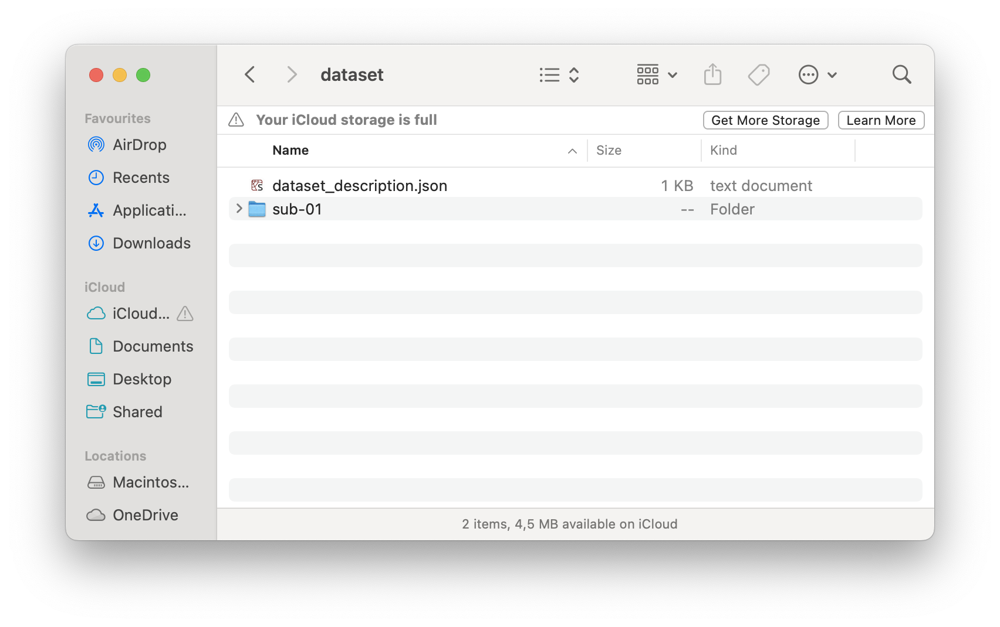

---

### Inside `sub-01/`

Within the `sub-01/` folder, there are two subdirectories:

- `anat/`: Contains anatomical data (e.g., `sub-01_T1w.nii.gz`)
- `func/`: Contains functional imaging data (e.g., `sub-01_task-rest_bold.nii.gz`) and its metadata file (`sub-01_task-rest_bold.json`)

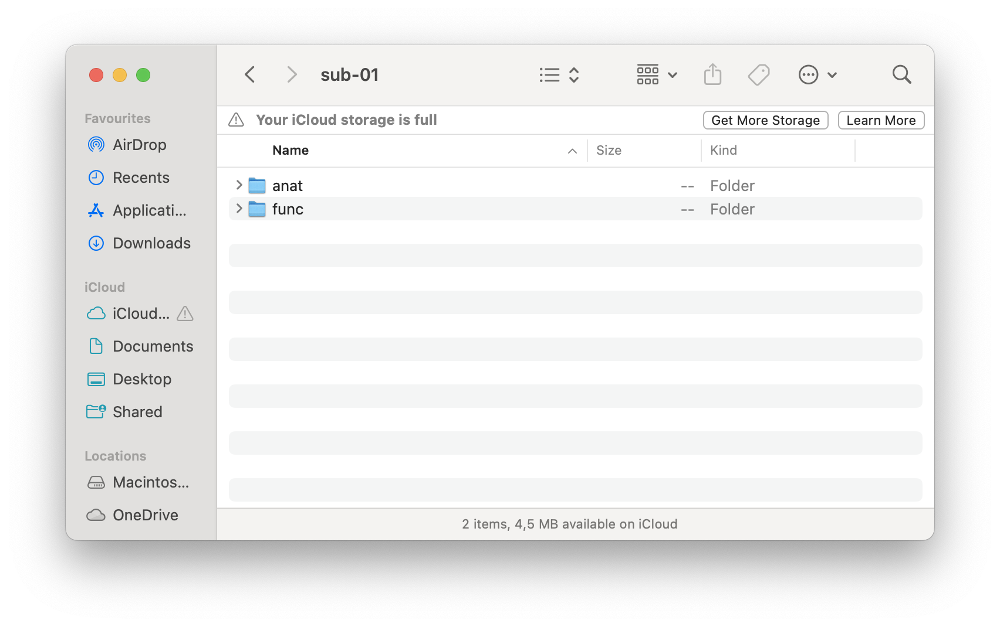

---

### Contents of Each Subfolder

#### `anat/` folder:

Contains the subject’s T1-weighted structural scan.

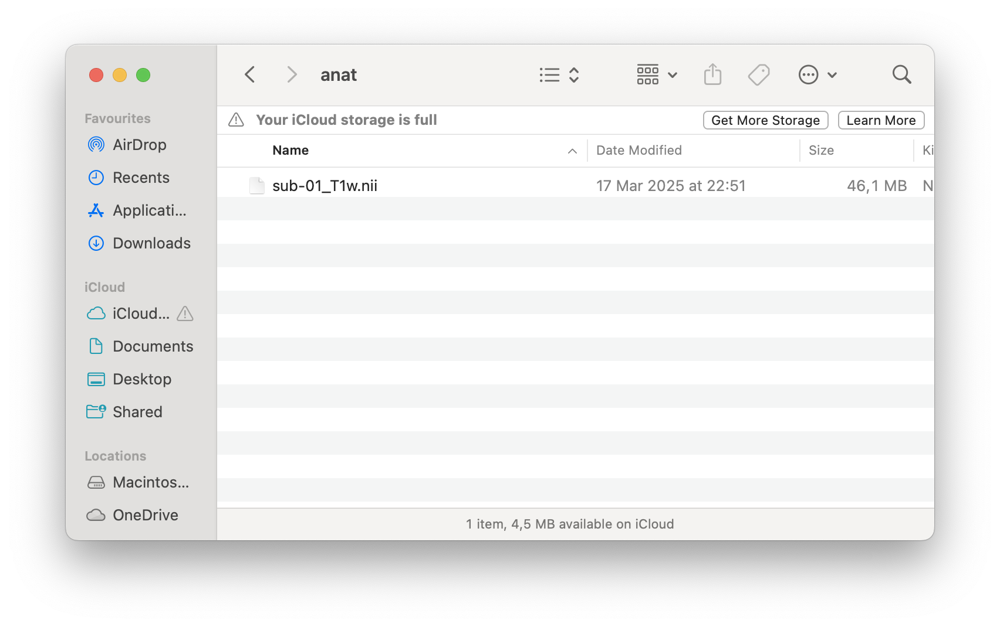

#### `func/` folder:

Contains the BOLD (functional MRI) image and accompanying metadata.

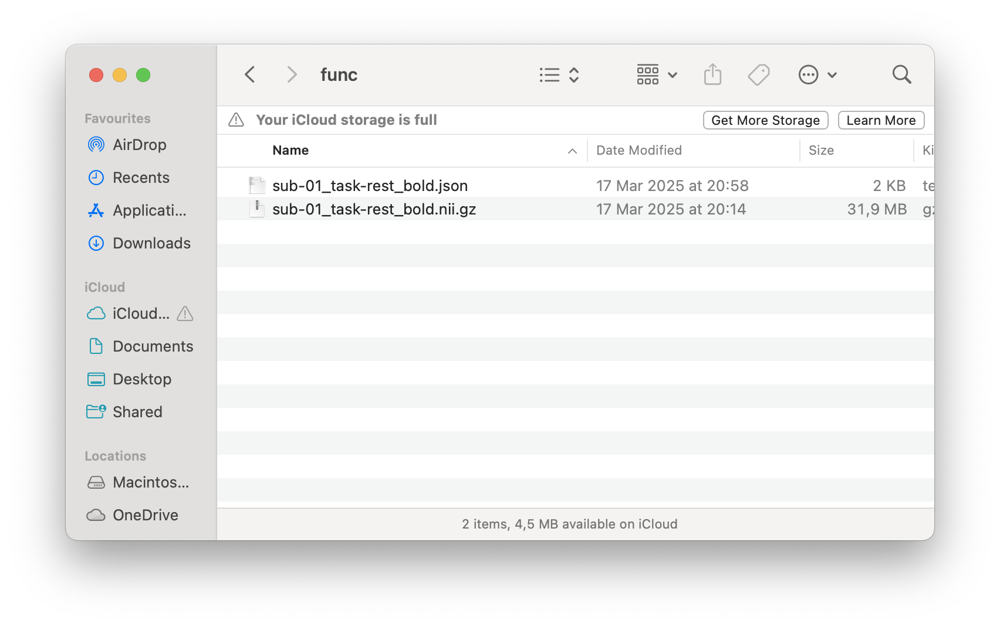

---

This structure is now ready to be validated using the BIDS Validator and preprocessed with fMRIPrep.


So, my dataset looks like this

```text
dataset/
├── dataset_description.json
└── sub-01/
    ├── anat/
    │   └── sub-01_T1w.nii.gz
    └── func/
        ├── sub-01_task-rest_bold.nii.gz
        └── sub-01_task-rest_bold.json


## Running BIDS Validator

Before preprocessing fMRI data, it's essential to validate that the dataset complies with the. This ensures compatibility and saves a lot of time before getting start to analyze the data.

In this step, I use the official **BIDS Validator Docker image** to check my dataset.

### What is Docker?

**Docker** is a tool that lets us run software in isolated containers without installing all the dependencies manually on your system.

---

### Running the Validator with Docker

#### My Actual Command (Mac) and Output

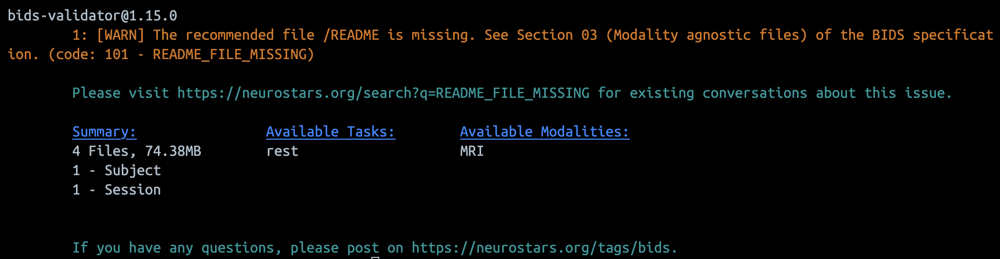

```bash
docker run --rm -it \
  --platform linux/amd64 \
  -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/dataset:/data:ro" \
    bids/validator /data

### Here’s what each part of the my Docker Command means:

- `-ti`:  
  Stands for **T**erminal + **I**nteractive. It allows us to interact with the terminal output of the container.

- `--rm`:  
  Tells Docker to **remove the container** after it's done running. This keeps things clean and avoids clutter from old containers.

- `--platform linux/amd64`:  
  Ensures that Docker uses the **Intel/AMD architecture** version of the container instead of the Apple Silicon (ARM) version.  
  Since I use M2 Macbook Air this is **crucial for M1/M2 Macs**, because many neuroimaging tools (like BIDS Validator and fMRIPrep) are not yet fully compatible with ARM-based containers.

- `-v "/local/path:/container/path:ro"`:  
  This **mounts local dataset folder** into the Docker container.  
  - `:ro` means the folder is **read-only** inside the container — the validator can read it, but not modify it.

- `bids/validator /data`:  
  This runs the **`bids/validator`** image and tells it to validate the `/data` folder inside the container.


### BIDS Validator Output Summary

The validator successfully recognized the following:

- **4 files**
- **1 subject** (`sub-01`)
- **1 session** (implicitly identified from the folder structure)
- **Task**: `rest`
- **Modality**: `MRI`

---

### Warning: README File Missing

- The validator returned a warning:  
  **`[WARN] The recommended file /README is missing`**

- This is **not an error** — just a reminder that I haven’t included a `README` file at the root of the dataset.

- A `README` is **recommended but not required**.

- Adding a `README` can help future collaborators understand the dataset content, context, and collection details. But for my purpose right now I skip it. Also I was not the one who collected this data.

This warning does **not prevent** fMRIPrep or other BIDS apps from working.



### For Generic Use 

Replace `/path/to/dataset` below with the full path to your dataset folder.

``` docker run -ti --rm
-v /path/to/dataset:/bids_dataset:ro
bids/validator /bids_dataset

## 2. Running fMRIPrep and XCP-D

## What is fMRIPrep?

[fMRIPrep](https://fmriprep.org) is a robust, community-developed tool for preprocessing fMRI data. It automates essential preprocessing steps while ensuring that the data is reproducible, standardized, and BIDS-compliant.

It handles:
- Skull-stripping and brain extraction
- Slice-timing and motion correction
- Spatial normalization to MNI space
- Anatomical-functional alignment
- Outputs ready for statistical analysis

Unlike older pipelines, fMRIPrep is modular and transparent — we can inspect every step by visualizing them in for example python or MATLAB, and it produces detailed visual reports for quality control.

To run fMRIPrep, I’ll use the official Docker container on my BIDS-validated dataset.

To preprocess my BIDS dataset, I used the official **fMRIPrep Docker container**, which performs all the core preprocessing steps and outputs data ready for analysis.

*Note:* fMRIPrep is computationally intensive and may take several hours depending on hardware.

Here’s the exact command I used on my Mac M2:

```bash
docker run --rm -it \
    --platform linux/amd64 \
    -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/dataset":/data:ro \
    -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives":/out \
    -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/work":/work \
    -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/license.txt":/license.txt \
    nipreps/fmriprep:latest /data /out participant \
    --participant-label sub-01 \
    --fs-license-file /license.txt \
    --work-dir /work

### What Each Part Does

- `--rm`:  
  Automatically removes the Docker container after it finishes running. Keeps our system clean from unused containers.

- `-it`:  
  Stands for *interactive terminal*. It allows us to see live logs and interact with the terminal if needed.

- `--platform linux/amd64`:  
  Ensures compatibility with **Intel/AMD architecture**, as anticipated above
- `-v "/.../dataset:/data:ro"`:  
  Mounts the local **BIDS dataset** folder into the container as `/data`. The `:ro` makes it read-only inside the container, which is recommended.

- `-v "/.../derivatives:/out"`:  
  This is the folder where fMRIPrep will write all the **preprocessed outputs** and **quality reports**.

- `-v "/.../work:/work"`:  
  Temporary workspace used by fMRIPrep to store intermediate results.

- `-v "/.../license.txt:/license.txt"`:  
  Mounts your local **FreeSurfer license file**, which is required for fMRIPrep to run. **!!** This step is important because FreeSurfer Licence is required to run fMRIPrep. Can be registered and downloaded here: [https://surfer.nmr.mgh.harvard.edu/registration.html](https://surfer.nmr.mgh.harvard.edu/registration.html)

- `nipreps/fmriprep:latest`:  
  The actual Docker image we are using — this one is the **latest official version** of fMRIPrep.

- `/data /out participant`:  
  These are the main **positional arguments**:
  - `/data`: path to the input BIDS dataset (inside the container)
  - `/out`: path to output folder (inside the container)
  - `participant`: run level — this tells fMRIPrep to preprocess **participant-level data**

- `--participant-label sub-01`:  
  Limits preprocessing to just subject `sub-01` instead of the whole dataset.

- `--fs-license-file /license.txt`:  
  Tells fMRIPrep where to find the **FreeSurfer license file** inside the container.

- `--work-dir /work`:  
  Specifies where to write temporary/intermediate files. Helpful for debugging or resuming a run.


#### Well... That took a lifetime. I had started to run fMRIPrep at 00.00 AM and it had finished at 6.00 AM. Now it is ready to explore outputs.

## 3. Exploring fMRIPrep Outputs

fMRIPrep creates a well-organized output folder under the directory I have mounted before I run it in my case it's:

    -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives":/out \

# Example: List output folders

### `anat/` Folder — Anatomical Outputs

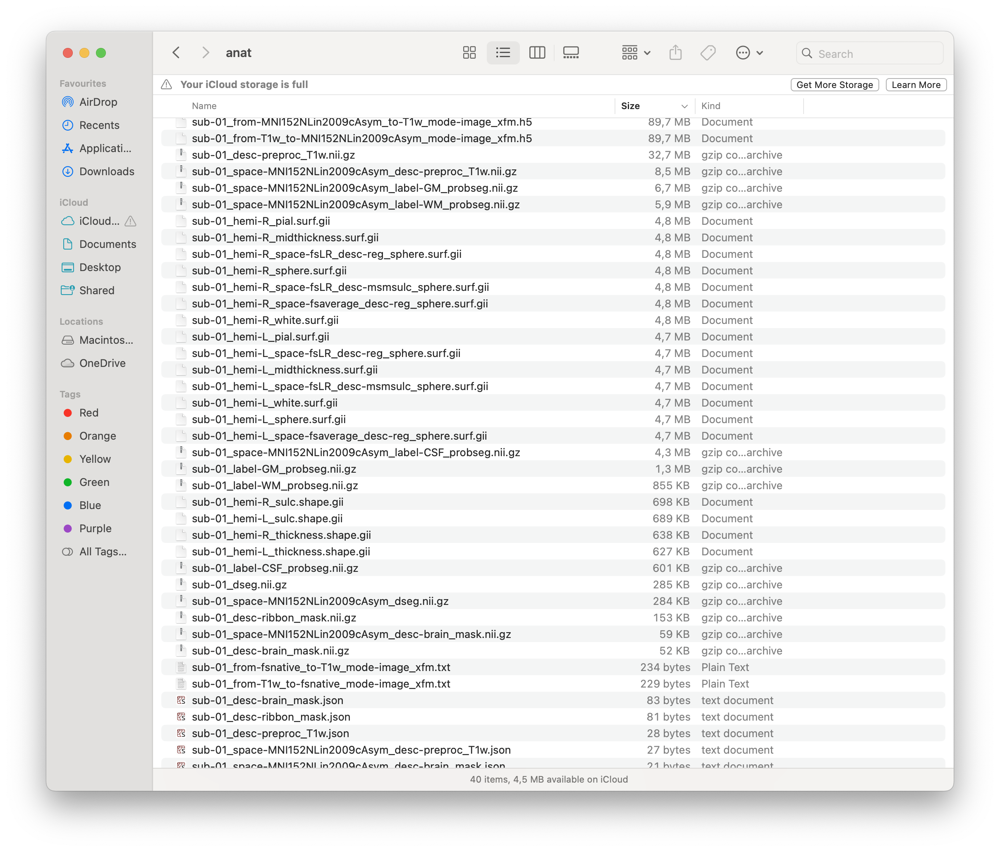

This folder contains preprocessed **T1-weighted structural images**, brain masks, segmentation files, surface files, and transformation matrices.

Key files:

- `sub-01_desc-preproc_T1w.nii.gz`  
  → Skull-stripped and bias-corrected T1-weighted image.

- `sub-01_dseg.nii.gz`  
  → Discrete segmentation of brain tissues: gray matter (GM), white matter (WM), cerebrospinal fluid (CSF).

- `sub-01_label-*_probseg.nii.gz`  
  → Probability maps for each tissue type (CSF, GM, WM).

- `sub-01_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz`  
  → T1w image in standard MNI space.

- `*.surf.gii` and `*.shape.gii` files  
  → Surface geometry (pial, white matter, mid-thickness), thickness, curvature, sulcal depth — useful for surface-based analysis.

- `*_xfm.h5`, `*_xfm.txt`  
  → Transformation matrices used for mapping between native and MNI spaces.

---


### `func/` Folder — Functional Outputs

This folder contains **preprocessed BOLD images**, confounds, reference volumes, and transformation data.

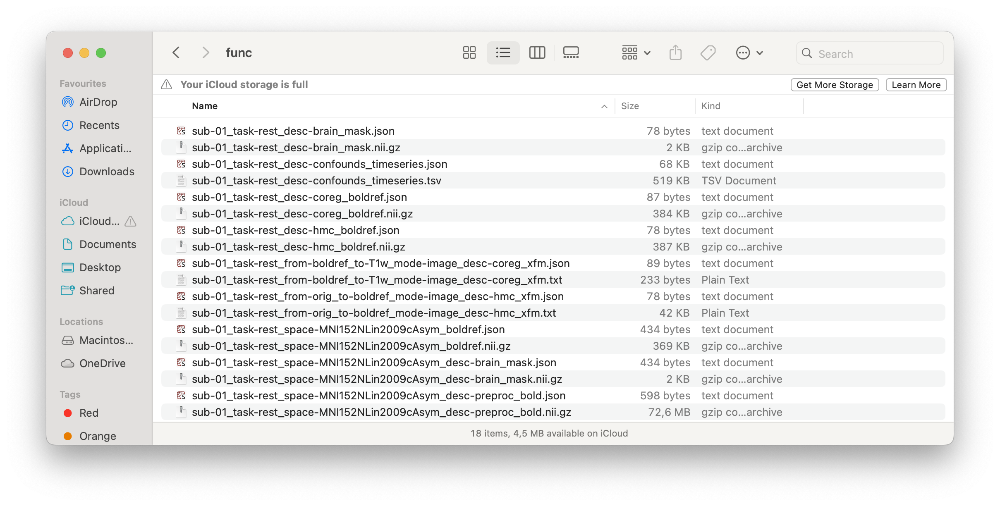

Key files:

- `sub-01_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz`  
  → Preprocessed BOLD time-series in standard MNI space — main input for downstream analysis.

- `sub-01_task-rest_desc-confounds_timeseries.tsv`  
  → Confound regressors (motion, global signal, CSF, WM, etc.) for denoising.

- `sub-01_task-rest_boldref.nii.gz`  
  → Single-volume reference from the BOLD run (used for alignment).

- `sub-01_task-rest_desc-coreg_boldref.nii.gz`  
  → BOLD reference coregistered to T1w image space.

- `*_xfm.*` and `*_mode-image_desc-*.json`  
  → Transformation files describing spatial mappings across functional, anatomical, and standard spaces.



### `figures` Folder — Visual Reports

Once fMRIPrep finishes running, it generates an HTML report for each subject, typically foud at the derivatives file. This report includes a **series of figures and quality checks** for both anatomical and functional preprocessing.

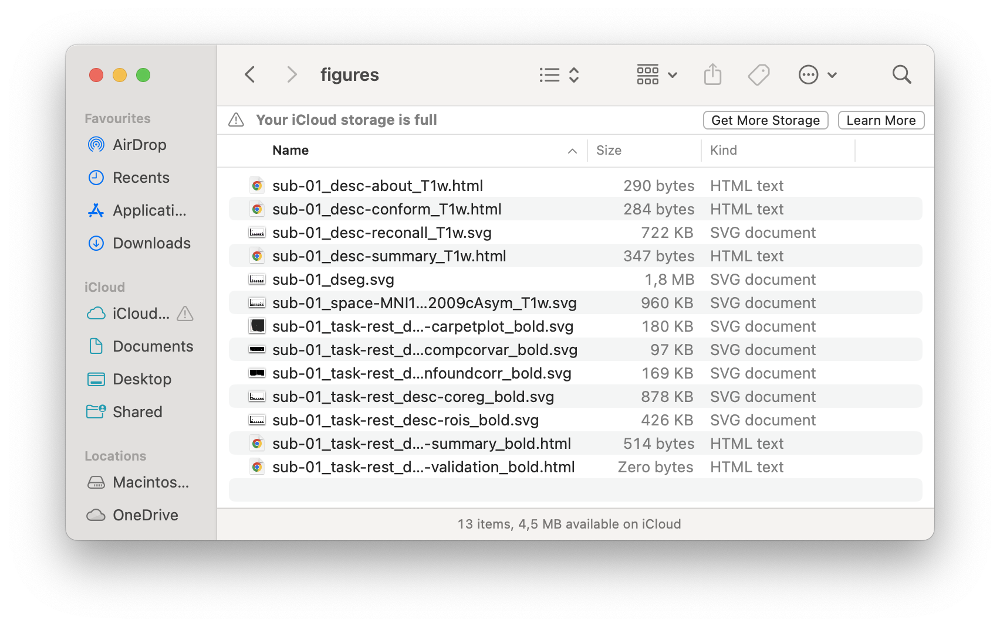


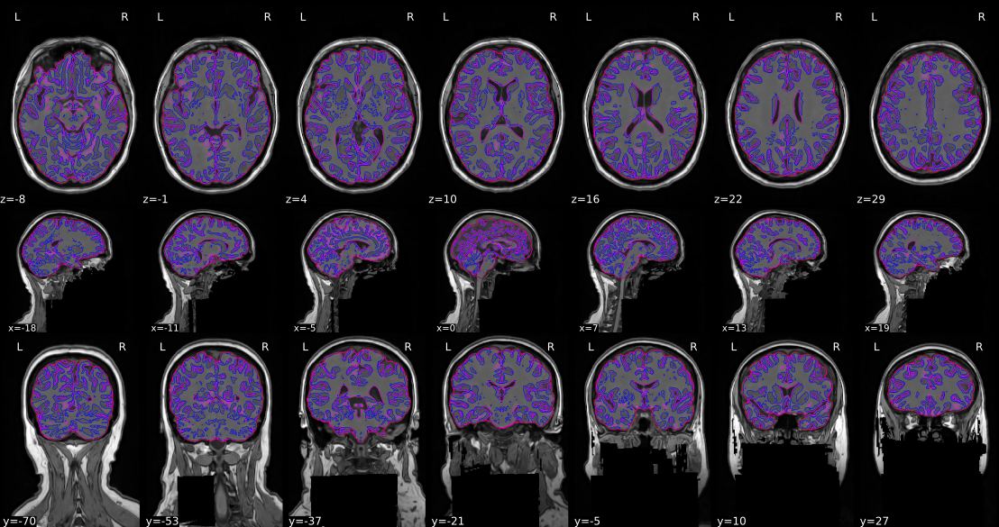

In [355]:
from IPython.display import SVG, display

display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_dseg.svg'))


### Figure of Brain Mask and Tissue Segmentation

This figure shows the **T1-weighted anatomical image** after preprocessing with fMRIPrep. What makes it informative is the **contour overlays** that delineate different **tissue types** within the brain. These are derived through **brain masking and tissue segmentation** algorithms during preprocessing.

#### What We See in This Visualization:

- **Background grayscale image**:  
  This is the subject’s **original T1w anatomical image** with **segmentation contours overlaid**.

#### What Each Contour Represents:

- **Red Line**  
  Outlines the **brain mask** — the border between actual brain tissue and surrounding meninges or skull. This shows the result of skull-stripping.

- **Purple Line**  
  Highlights regions filled with **cerebrospinal fluid (CSF)**, especially visible around the **ventricles** and cortical sulci.

- **Blue Line**  
  Likely indicates **deep white matter boundaries** or interfaces between **white matter and gray matter** — helpful for surface reconstruction or volume-based parcellations.

---

These segmentation contours are used to:

- Generate confound regressors (like CSF and WM signals)
- Assist in spatial normalization
- Support surface-based analyses
- Ensure brain tissue is correctly isolated for subsequent steps

> These overlays give an immediate sense of whether fMRIPrep segmented the brain accurately. Poor contour alignment would signal potential preprocessing issues.


#### Why It Matters:

- Ensures the brain extraction and segmentation steps were successful.
- Verifies anatomical boundaries are well-aligned with expected brain structures.
- Offers **visual quality control** before functional overlays or registration to standard space.


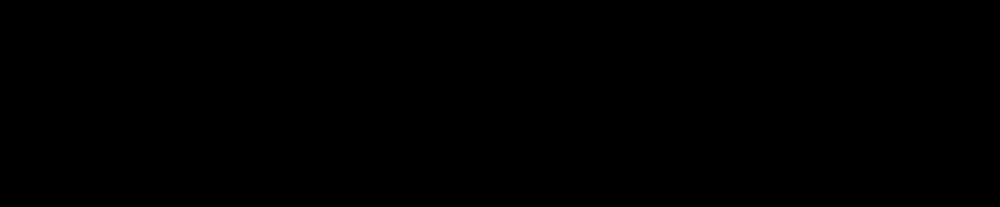
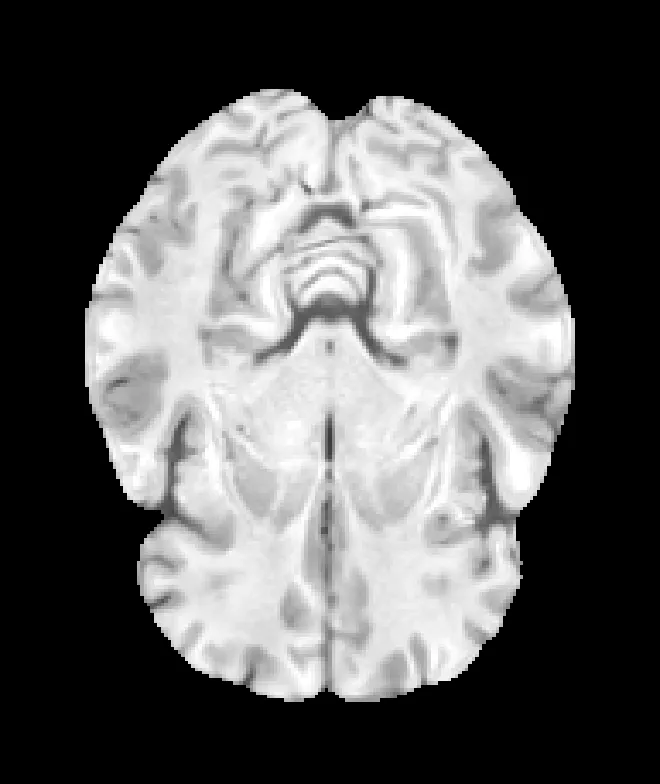
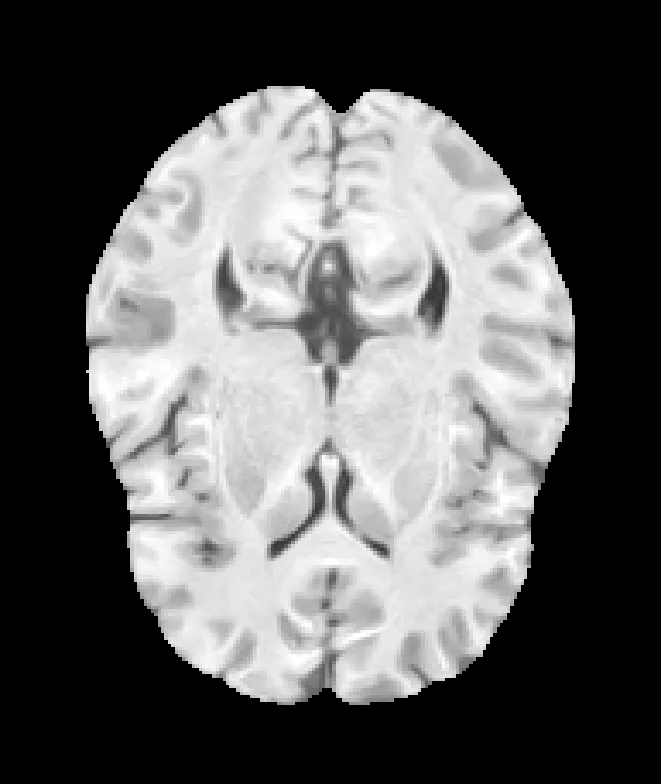
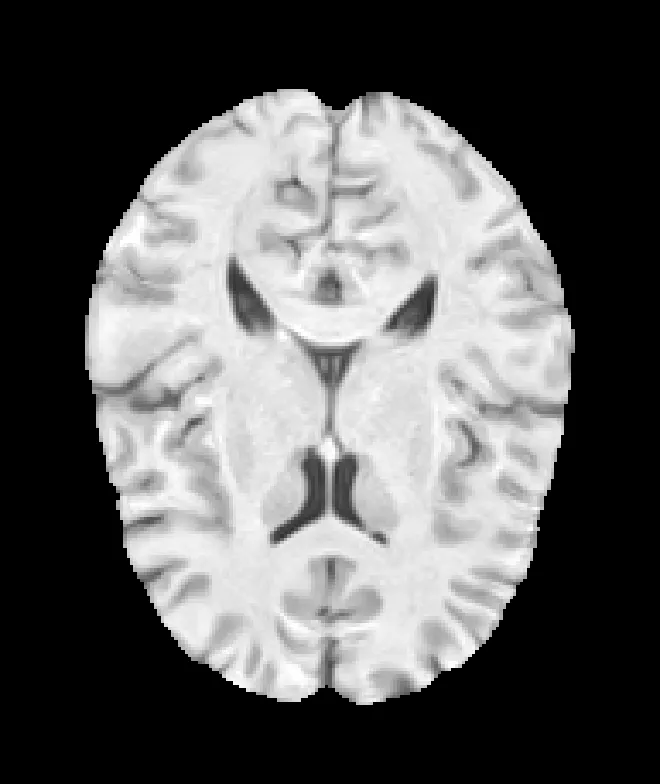
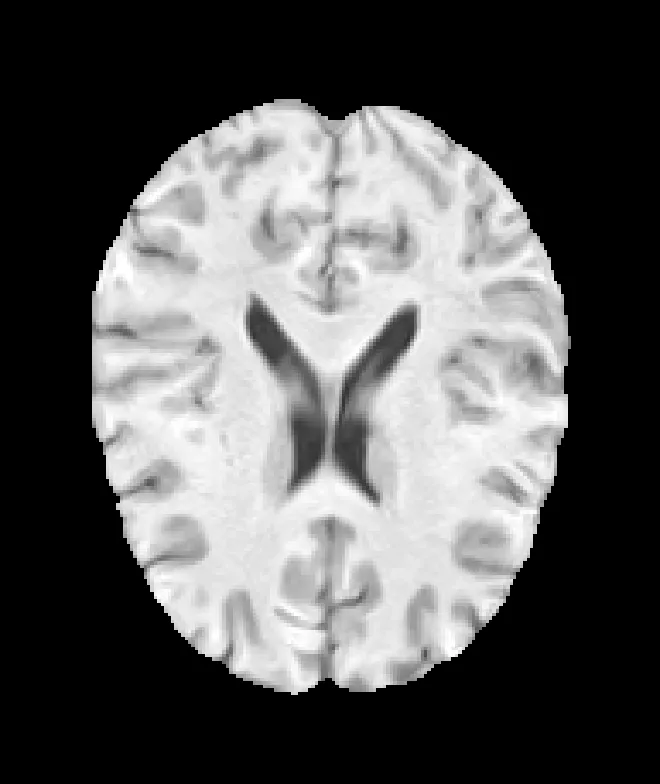
...
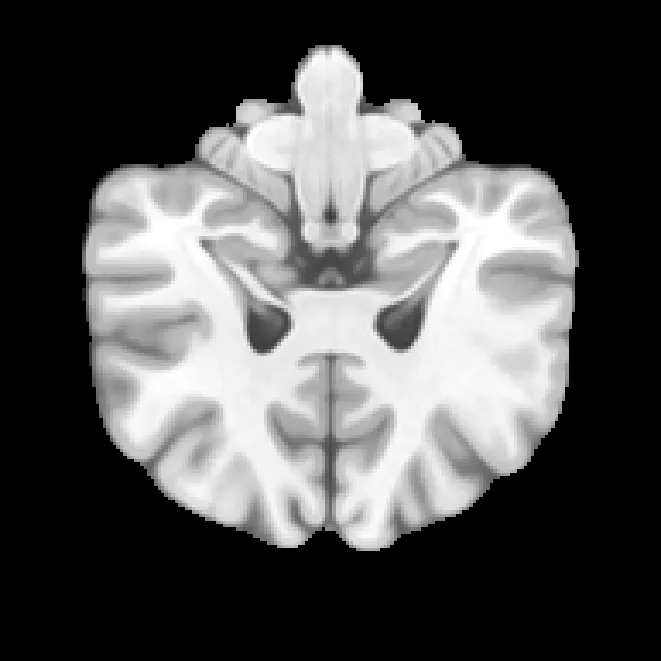
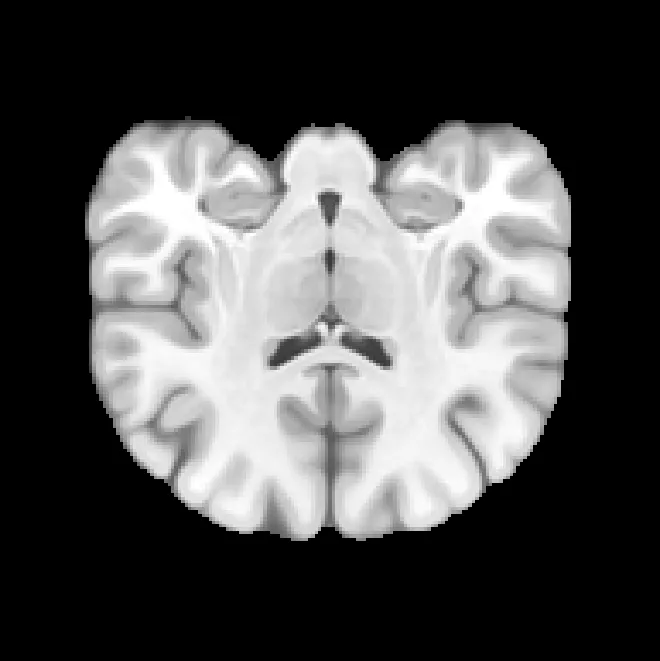
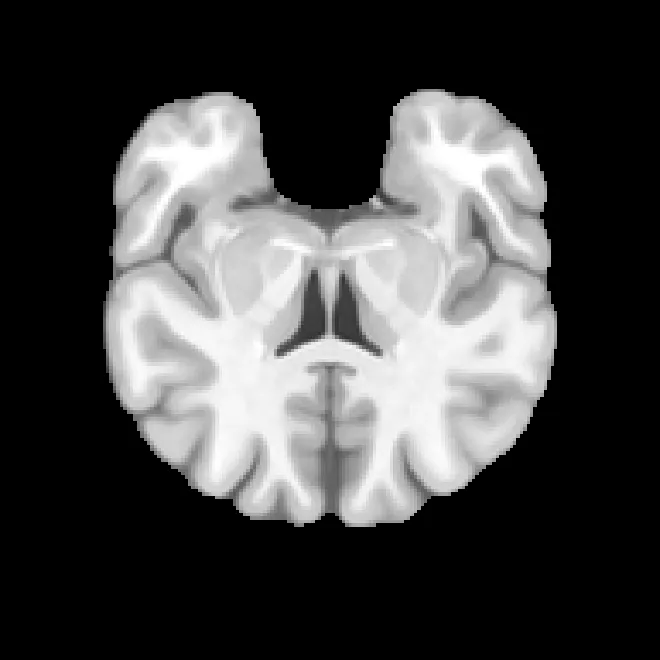
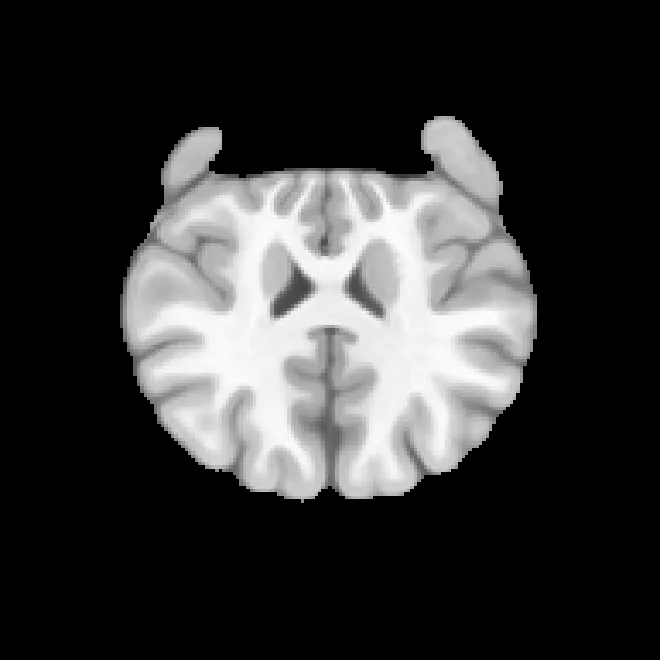
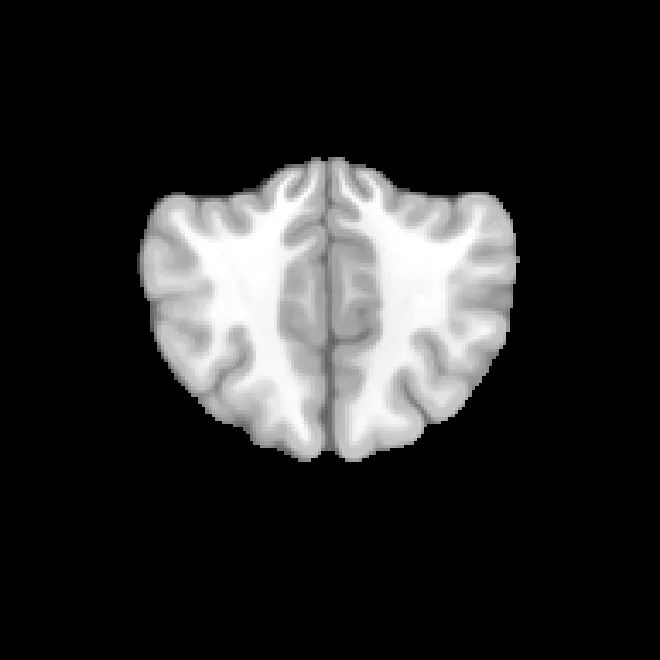

In [357]:
from IPython.display import HTML

with open('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_space-MNI152NLin2009cAsym_T1w.svg', "r") as f:
    svg_content = f.read()

display(HTML(svg_content))

### Spatial Normalization

This figure shows the result of **nonlinear registration** of the subject’s anatomical image to the **MNI152NLin2009cAsym** standard space (Hold your mouse on the image to see alternation between the images)

The image alternates between:
- The participant’s own **T1-weighted brain**
- The **MNI152 template** (standard brain used in group-level analyses)

#### What to Look For:

- The brain boundaries should align closely between the two views.
- Sulci and gyri should approximately match.
- The cerebellum and brainstem should fall into correct positions.
- No major misalignments or shifts should be present.

This visual check ensures that future group-level analyses using standard space (like voxelwise comparisons or atlas-based extractions) will be anatomically meaningful.

> If the two brains overlap well, normalization has worked as intended.


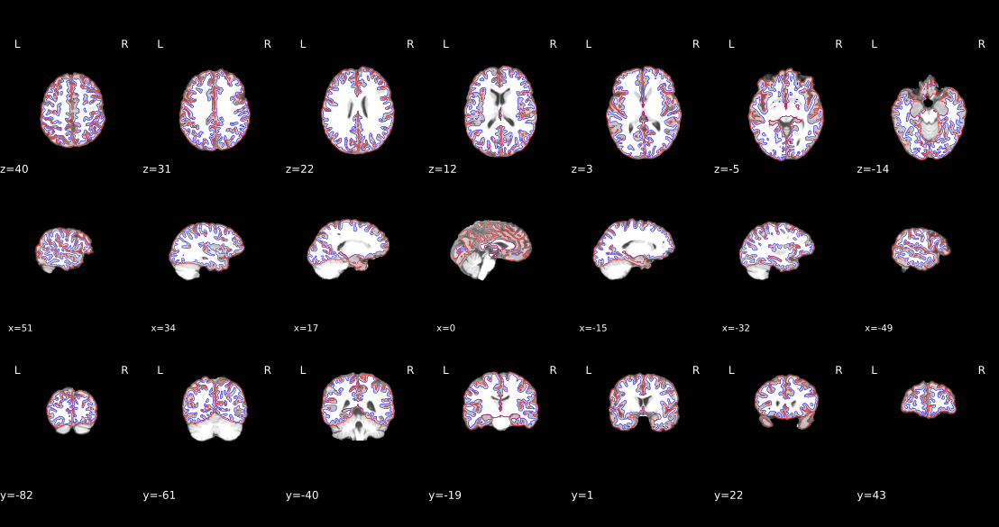

In [359]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_desc-reconall_T1w.svg'))

### Surface Reconstruction

This figure shows the result of cortical **surface reconstruction** performed by FreeSurfer's `recon-all` pipeline — automatically invoked by fMRIPrep when a valid FreeSurfer license is provided. It uses the licence we have linked in the Docker's terminal before running the fMRIPrep.

The reconstructed surfaces are overlaid on the **T1-weighted anatomical scan** to visually inspect how well the white and pial surfaces match the cortex.

---

#### What Surfaces Are Shown:

- **White Matter Surface**:  
  Inner surface separating white matter from gray matter — follows the boundary of the deep white matter.

- **Pial Surface**:  
  Outer surface tracing the boundary between cortex and CSF — tracks the folding of the gyri and sulci.

These surfaces are generated **per hemisphere** and are key to performing **surface-based analysis**, such as:
- Cortical thickness estimation
- Surface parcellation
- Vertex-wise functional or structural mapping
- Alignment across subjects based on folding patterns

---

#### Why This Matters

- Surface reconstruction allows mapping of data **on the cortical sheet**, which avoids mixing signals from different tissues (like CSF or white matter).
- It’s especially powerful for:
  - **Functional analysis** with high spatial precision
  - **Multimodal alignment** across subjects
  - **Anatomical studies** of brain morphology


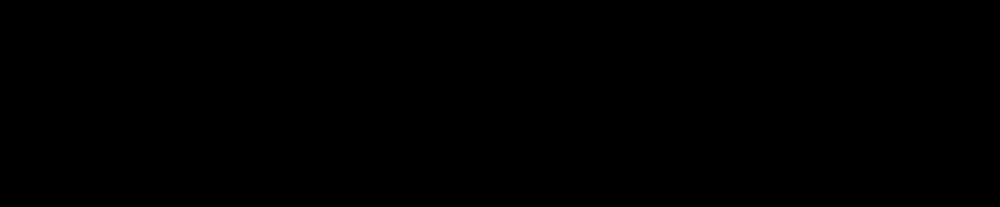
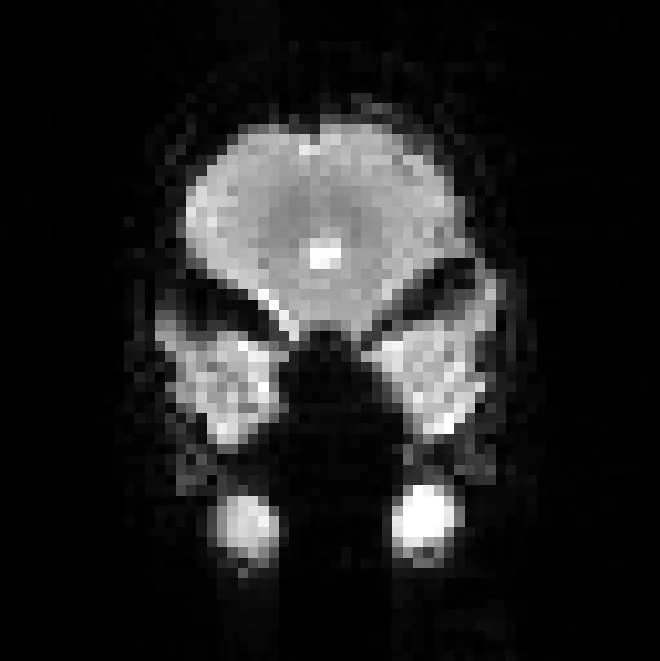
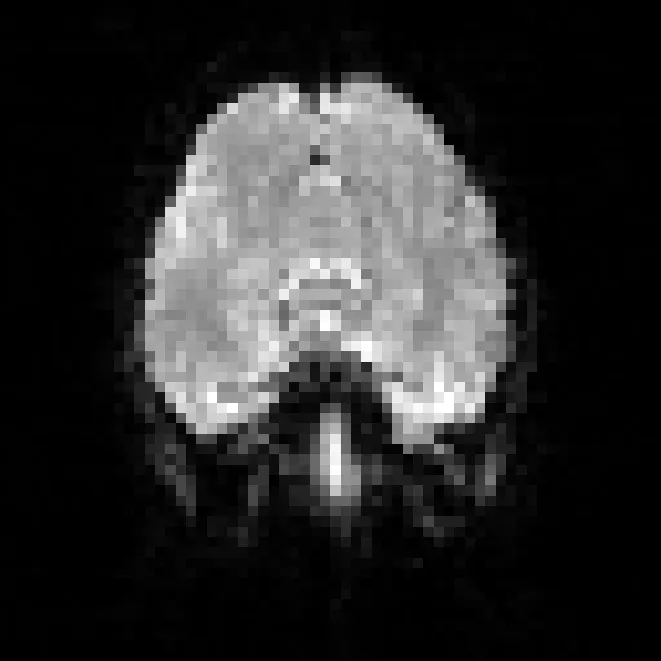
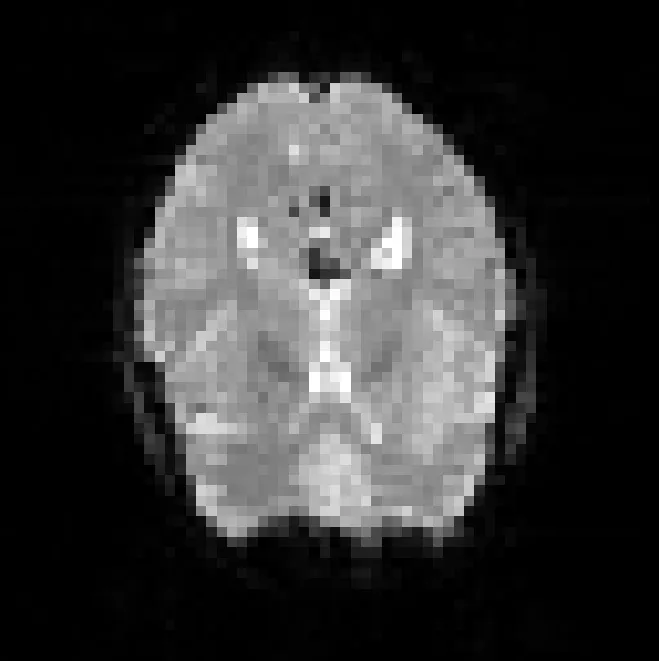
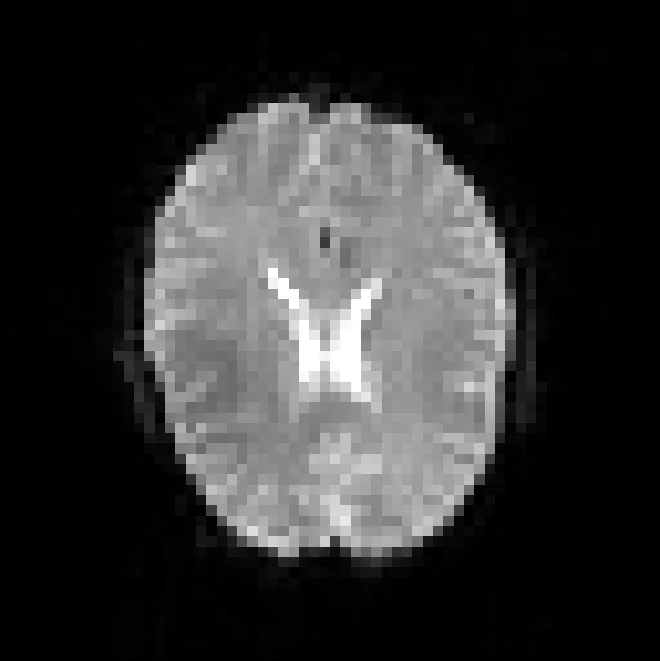
...
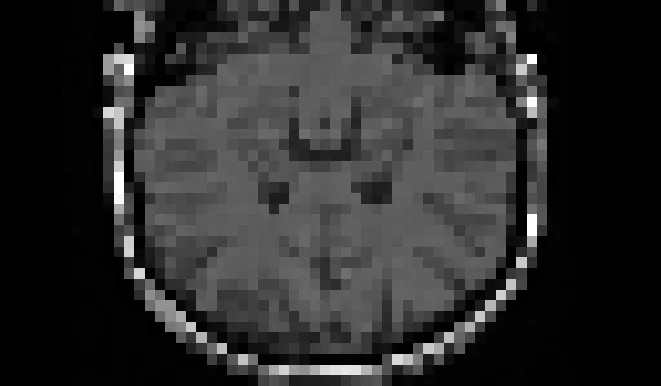
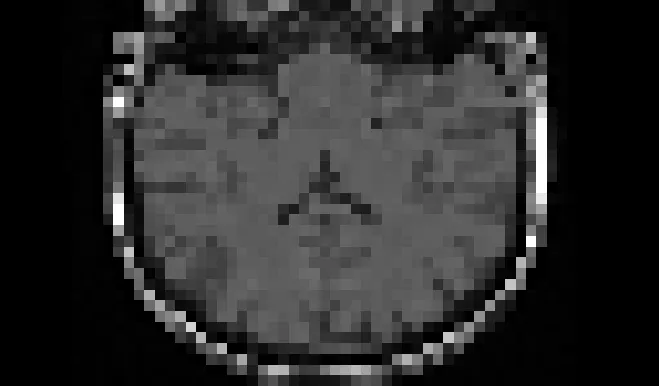
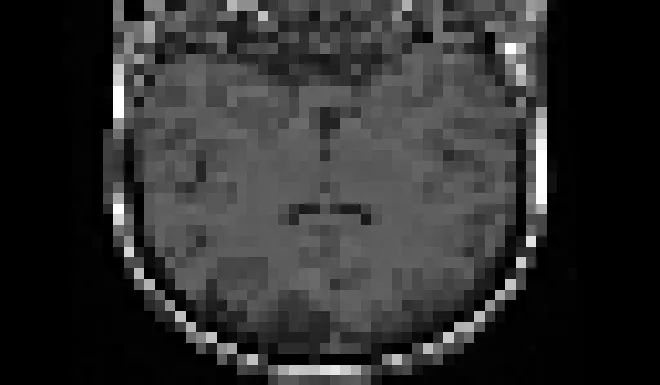
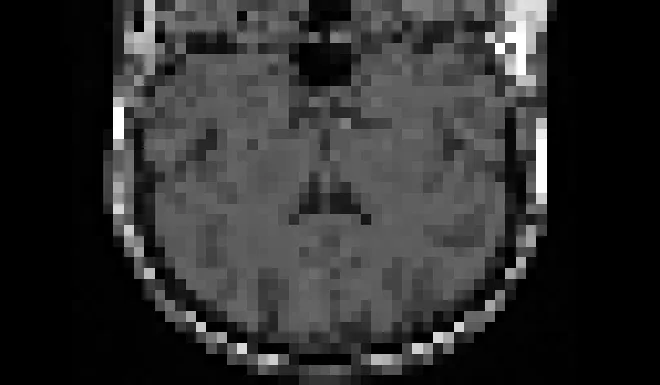
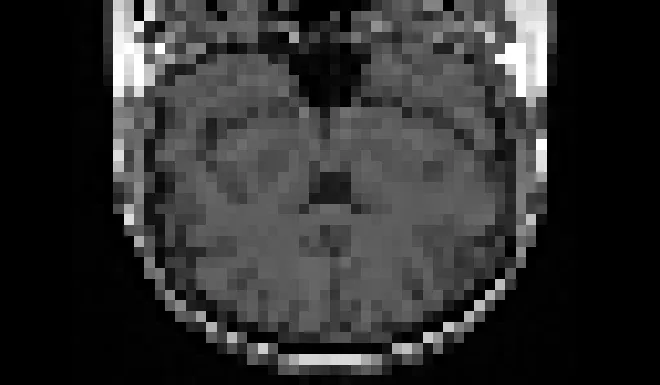

In [361]:
from IPython.display import HTML

with open('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_task-rest_desc-coreg_bold.svg', "r") as f:
    svg_content = f.read()

display(HTML(svg_content))

### Coregistration of Functional and Anatomical Data

This figure shows the result of aligning the subject's reference EPI (BOLD) image to their anatomical T1-weighted (T1w) image (To see alternation hold your mouse on the image) 

- The **background** shows the contrast-enhanced BOLD image.
- The **red contour** outlines the anatomical white matter mask, resampled into the EPI space.
- This alignment step is critical because further preprocessing steps rely on accurate mapping between functional and anatomical spaces.

We should check that:
- Red contours align well with the white matter structures in the BOLD image.
- There is no major misalignment in any direction (axial, sagittal, coronal).

A good registration is a key prerequisite for accurate downstream analysis.


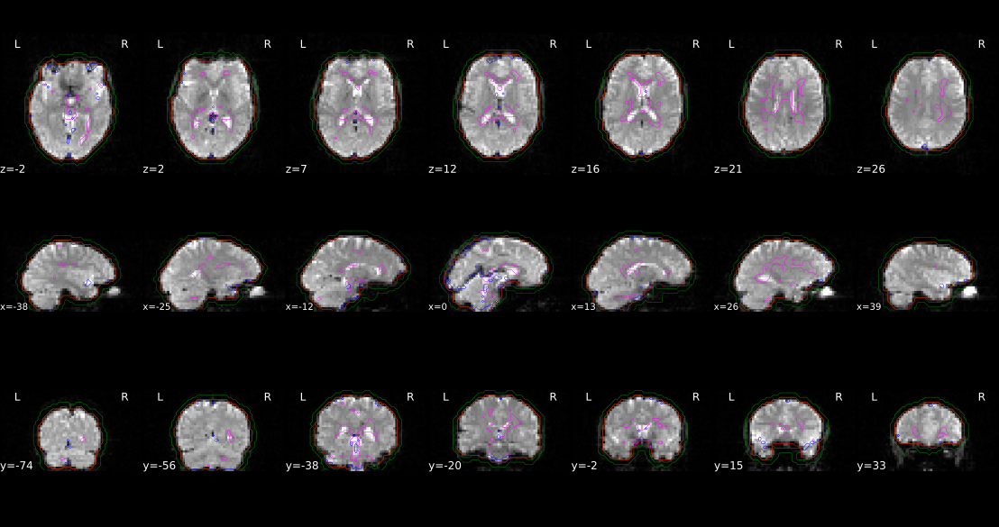

In [363]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_task-rest_desc-rois_bold.svg'))


### Brain Mask and (Anatomical/Temporal) CompCor ROIs

This panel shows how fMRIPrep defines regions of interest (ROIs) for physiological noise correction using the **CompCor (Component-Based Noise Correction)** strategy. These ROIs are derived from the BOLD signal and are used to extract noise components that can be regressed out during analysis.

The contours overlaid on the BOLD image denote:

- **Red contour**: The brain mask calculated from the BOLD signal.
- **Pink contour**: *Anatomical CompCor ROI*, combining cerebrospinal fluid (CSF) and white matter (WM), where minimal gray matter is present. This helps capture physiological noise from non-neuronal tissue.
- **Blue contour**: *Temporal CompCor ROI*, includes the top 2% most variable voxels within the brain, identifying dynamic noise sources.
- **Green contour**: *Brain edge (or crown) ROI*, picks voxels just outside the brain, targeting signals from motion or scanner artifacts.

These ROIs are decomposed into components via PCA and included as confound regressors in downstream denoising.

Careful inspection ensures these masks are correctly placed and exclude gray matter as much as possible from those regions that can lead distortions in our analyze.


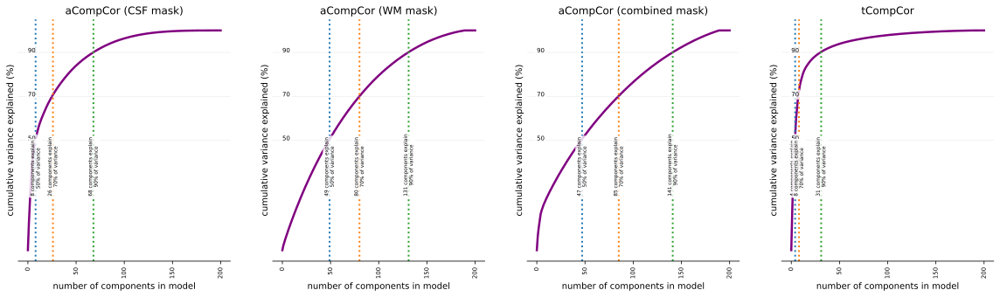

In [365]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_task-rest_desc-compcorvar_bold.svg'))

### Variance Explained by t/aCompCor Components

This panel shows how much of the BOLD signal variance is explained by principal components extracted from the CompCor regions of interest (ROIs). These components are later used as nuisance regressors to clean the signal from non-neuronal artifacts.

We see four plots:

1. **aCompCor (CSF mask)**:
   - Components are derived from voxels in the CSF ROI.
   - CSF is expected to capture physiological noise like cardiac and respiratory signals.
   - ~8 components are needed to explain 50% of the variance, ~68 for 90%.

2. **aCompCor (White Matter mask)**:
   - Similar process but applied to the white matter ROI.
   - White matter is also useful for modeling physiological noise.
   - Needs slightly more components (~49 for 50%, ~131 for 90%).

3. **aCompCor (Combined CSF + WM)**:
   - This combined ROI often explains more variance efficiently.
   - ~47 components explain 50%, ~141 explain 90%.

4. **tCompCor**:
   - Temporal CompCor uses the top 2% most variable voxels across the entire brain.
   - Designed to capture dynamic, high-variance noise.
   - Requires fewer components to reach high variance (~4 for 50%, ~31 for 90%).

These plots help in selecting how many components to include in our GLM or denoising pipeline.

> **Note:** Don't forget that these principal components are not neural signals of interest. They are likely capturing noise — such as physiological fluctuations (e.g., heart rate, respiration), scanner drift, or other non-neuronal sources — that interfere with the BOLD signal. Removing them helps clean the data and improve statistical inference.

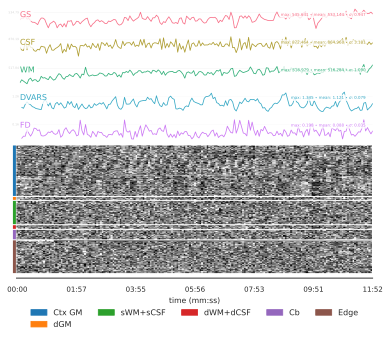

In [367]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_task-rest_desc-carpetplot_bold.svg'))

### BOLD Summary

This section summarizes key time series and quality metrics extracted from the BOLD data. These metrics help assess signal characteristics and identify potential artifacts or noise sources in the dataset.

#### Signals Tracked

- **GS (Global Signal)** – Mean BOLD signal across all brain voxels.  
- **CSF (Cerebrospinal Fluid)** – Signal extracted from the CSF mask.  
- **WM (White Matter)** – Signal extracted from the white matter mask.  
- **DVARS** – Measures the rate of change in BOLD signal across the entire brain from one volume to the next. Large spikes may reflect motion or physiological noise.  
- **FD (Framewise Displacement)** – Quantifies head motion between consecutive volumes. Values above a threshold (e.g., 0.5 mm) are often flagged.

Each of these lines shows how the signal evolves over time. A stable pattern suggests clean data, while irregular jumps or fluctuations may indicate noise or motion artifacts.

#### Carpet Plot

The bottom half of this section shows a **carpet plot**:

The carpet plot visualizes the BOLD signal across time for all voxels within the brain mask. 

- **X-axis**: Time in `minutes:seconds` format, corresponding to each volume acquired during the scan.
- **Y-axis**: Voxels grouped by tissue class or ROI (e.g., Ctx GM, WM, CSF).
- The colored bars on the left show which group each set of voxels belongs to:
  - Blue: Cortical gray matter (Ctx GM)
  - Orange: Deep gray matter (dGM)
  - Green: Subcortical white matter and superficial CSF (sWM + sCSF)
  - Red: Deep WM and CSF (dWM + dCSF)
  - Purple: Cerebellum (Cb)
  - Brown: Edge of the brain

This plot is useful for identifying artifacts, motion spikes, or intensity shifts. Clear horizontal lines or vertical bands may indicate systematic noise that needs to be addressed in further preprocessing or denoising steps.

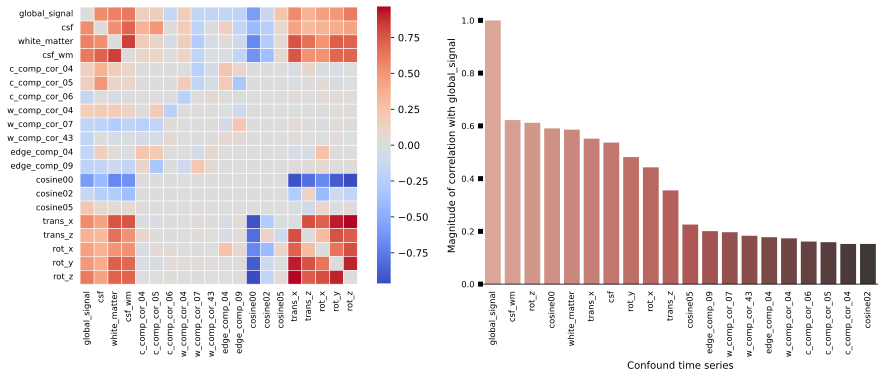

In [369]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/figures/sub-01_task-rest_desc-confoundcorr_bold.svg'))

### Correlations Among Nuisance Regressors

This section summarizes the relationships among nuisance regressors that fMRIPrep extracted to be used as potential confounds in subsequent denoising steps.

---

#### Left: Correlation Matrix (Heatmap)

The heatmap shows **Pearson correlation coefficients** between all pairs of confound time series:

- **Red** regions represent strong positive correlations.
- **Blue** regions indicate strong negative correlations.
- **Gray** areas reflect weak or no correlation.

We can observe that:
- **Global signal**, **CSF**, and **white matter** regressors are highly correlated with one another.
- **Motion parameters** (e.g., `trans_x`, `rot_z`) also show moderate correlations with several physiological signals.
- **CompCor components** (e.g., `c_comp_cor_04`, `w_comp_cor_04`) are mostly orthogonal by design, hence showing little to no correlation with other regressors.

---

#### Right: Magnitude of Correlation with Global Signal

This bar plot ranks each confound regressor by its **absolute correlation magnitude** with the global signal. This helps identify which signals contribute most to global fluctuations in the BOLD signal:

- As expected, the **global signal** itself shows a perfect correlation (1.0).
- Regressors such as `csf_wm`, `csf`, `rot_z`, and `trans_x` are also strongly correlated, indicating their potential to introduce noise if not controlled.
- Lower bars (e.g., `c_comp_cor_04`, `cosine02`) suggest minimal contribution to global signal variance.

---

#### Why This Matters

This analysis helps us:
- Decide which confounds to include in a denoising model.
- Avoid **multicollinearity**, which can affect regression estimates.
- Understand the structure of noise in our dataset (motion-related, physiological, scanner drift, etc.).

### Let's Explore More by Ourselves

While **fMRIPrep** provides an excellent set of standardized quality control figures and preprocessing outputs, it does **not include every possible quality metric or visual comparison** that could inform your data understanding. Also it's fun to play with the intermediate steps to see what was happening before the final report.

/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/263145924.py:10: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  mean_raw = image.mean_img(raw_bold)
/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/263145924.py:11: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  mean_preproc = image.mean_img(preproc_bold)


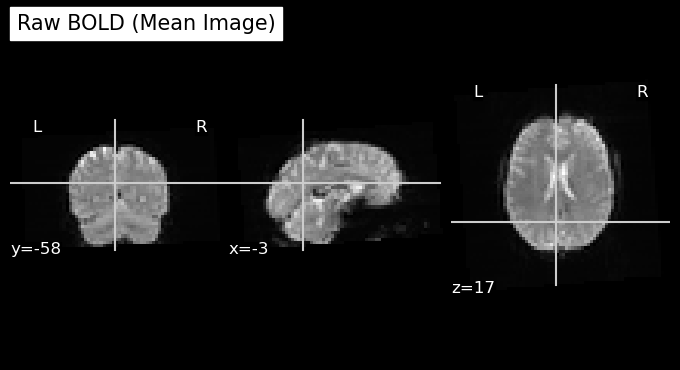

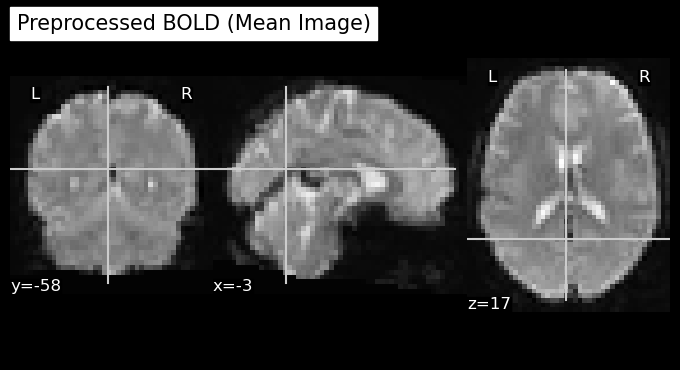

In [372]:
#I want to see mean BOLD signal for the raw BOLD image and for the preprocessed BOLD image.

from nilearn import image, plotting

# File paths
raw_bold = "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/dataset/sub-01/func/sub-01_task-rest_bold.nii.gz"
preproc_bold = "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz"

# Mean across time
mean_raw = image.mean_img(raw_bold)
mean_preproc = image.mean_img(preproc_bold)

cut_coords = (-3, -58, 17) #I want to see these coordinates for both raw and preprocessed BOLD (No specific reason arbitary choice)

# plotting
plotting.plot_epi(mean_raw, title="Raw BOLD (Mean Image)", cut_coords=cut_coords, cmap='gray')
plotting.plot_epi(mean_preproc, title="Preprocessed BOLD (Mean Image)", cut_coords=cut_coords, cmap='gray')


Visualizing the mean BOLD signal helps assess overall image quality by averaging out temporal noise. Comparing raw and preprocessed mean images allows us to inspect improvements from preprocessing—such as denoising, intensity normalization, and alignment to template space. Although the coordinates are arbitrarily chosen, using the same ones ensures a fair visual comparison.

/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/1437193807.py:6: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  mean_mni = image.mean_img(bold_mni)


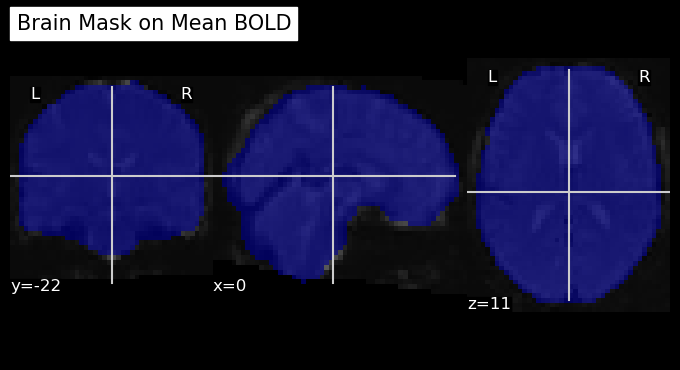

In [374]:
#I want to overlay normalized functional mask on the mean BOLD signal which is also normalized and preprocessed

from nilearn import image, plotting

bold_mni = "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz"
mean_mni = image.mean_img(bold_mni)
mask_file = "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz"

# Plottin g the mask over the mean BOLD image
plotting.plot_roi(mask_file, bg_img=mean_mni, title="Brain Mask on Mean BOLD")


All voxels outside the blue brain mask represent non-brain tissue or noisy regions with unreliable BOLD signal. These are automatically excluded to improve the accuracy and reliability of downstream analyses.

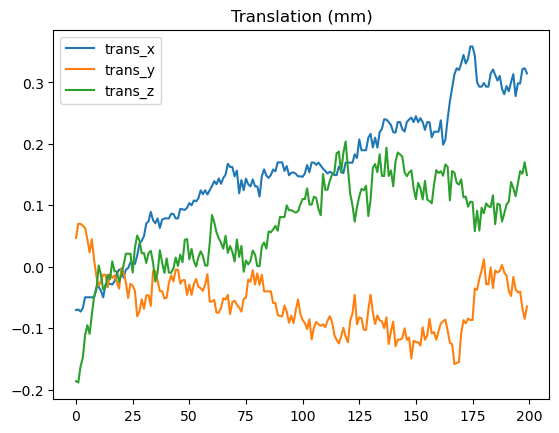

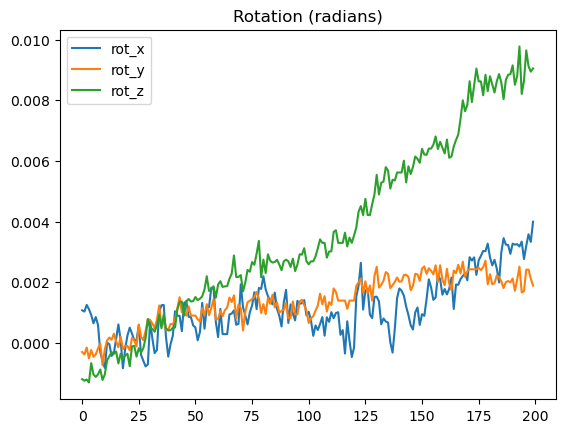

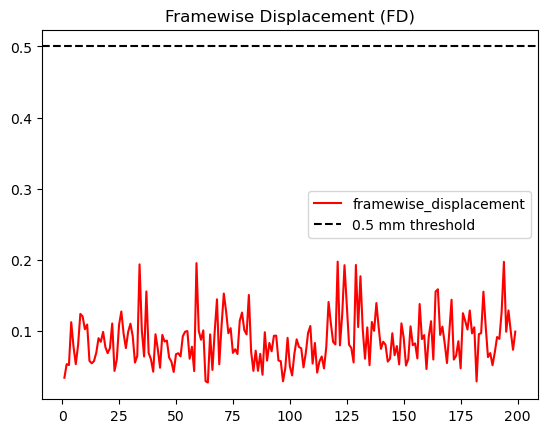

In [376]:
import pandas as pd
import matplotlib.pyplot as plt

confound_path = "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_desc-confounds_timeseries.tsv"
confounds = pd.read_csv(confound_path, sep='\t')

confounds[['trans_x', 'trans_y', 'trans_z']].plot(title='Translation (mm)')
plt.show()

confounds[['rot_x', 'rot_y', 'rot_z']].plot(title='Rotation (radians)')
plt.show()

confounds['framewise_displacement'].plot(title='Framewise Displacement (FD)', color='red')
plt.axhline(0.5, color='black', linestyle='--', label='0.5 mm threshold') #I choose 0.5 but in the XCP-D analysis it's chosen 0.3 mm
plt.legend()
plt.show()


Head motion is one of the most significant sources of noise in fMRI data. Even sub-millimeter movement can introduce artifacts that mimic or obscure true neural signals.

With this, I load the motion-related confound regressors generated by **fMRIPrep** and visualize them to:

- **Track translation** (displacement along x, y, z axes in mm)
- **Track rotation** (angular displacement in radians)
- **Identify motion spikes** using **Framewise Displacement (FD)**

## Post-fMRIPrep Denoising with XCP-D

After preprocessing the raw BOLD data with `fMRIPrep`, the next critical step is to remove residual noise sources from the signal — including motion, physiological fluctuations, and scanner drift. For this, I used **XCP-D (eXtensible Connectivity Pipeline for Denoising)**.

### Why We Use XCP-D?

While fMRIPrep standardizes the spatial preprocessing steps (e.g., alignment, normalization), it intentionally **avoids aggressive temporal denoising**, leaving that decision to the researcher.

**XCP-D** picks up where fMRIPrep leaves off. It applies:

-  Motion regression and FD filtering  
-  High-pass or bandpass filtering (optional)  
-  Confound regression using aCompCor or other strategies  
-  Optional despiking and smoothing  
-  Denoising pipelines tailored to research-grade functional connectivity analysis  
-  QC metric extraction and reporting

---

### XCP-D Output Overview

After running XCP-D in `--mode abcd`, the outputs are saved to the `xcp_out/` directory and include:

- **Denoised BOLD time series** (per run/subject)
- **Confound regression QC metrics** (e.g., FD, DVARS)
- **Residual time series plots**
- **Quality-controlled metadata**
- **(Optional)** Parcellated time series and functional connectivity matrices if atlases are specified

---

### What's Next?

These cleaned outputs can now be used for:

- Extracting ROI-based signals
- Computing functional connectivity matrices
- Running statistical models
- Visualizing network graphs


### XCP-D Postprocessing: Docker Command Explained Step by Step

Below is the Docker command I used to run **XCP-D** for denoising and quality control of my fMRIPrep-preprocessed BOLD data.

```bash
docker run -it --rm \
  --platform linux/amd64 \  # Ensures compatibility with the container's architecture on Mac M1/M2 chips
  -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives":/xcp_in:ro \  # Mounts fMRIPrep output (read-only) as input to XCP-D
  -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out":/xcp_out \        # Where XCP-D will write denoised outputs
  -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_work":/xcp_work \      # Working directory for temporary files
  -v "/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/license.txt:/opt/freesurfer/license.txt" \  # FreeSurfer license file
  pennlinc/xcp_d:latest \  # Uses the official XCP-D Docker image
  /xcp_in /xcp_out participant \  # Input folder, output folder, and 'participant' mode
  --participant-label sub-01 \  # Specifies the subject ID to process
  --input-type fmriprep \       # Tells XCP-D the input structure is from fMRIPrep
  --mode abcd \                 # Applies a standardized ABCD-style confound regression pipeline
  --fs-license-file /opt/freesurfer/license.txt \  # Location of the license file inside the container
  --file-format nifti \         # Outputs will be in NIfTI format (not CIFTI/fsLR)
  --motion-filter-type notch \  # Applies notch filtering to reduce respiratory motion noise
  --band-stop-min 12 \          # Lower frequency bound (in BPM) for the notch filter
  --band-stop-max 20 \          # Upper frequency bound for the notch filter
  --output-type interpolated \  # Interpolates over high-motion timepoints instead of censoring them
  --warp-surfaces-native2std n \  # Disables surface normalization (we are using NIfTI volumes only)
  --skip-parcellation           # Skips parcellation and matrix creation to avoid atlas-related errors


Since XCP-D is not as computationally demanding as fMRIPrep it did not take a lifetime as fMRIPrep did.

This lines of codes achives:

- Cleaned and denonised the BOLD time series
- Regressed out motion, physiological and scanner confounds.
- Applied despiking and smoothing.
- Creates useful QC outputs: Motion plots, residual BOLD images, ALFF and ReHo maps

Final outputs can be used for functional connectivity analysis. Before doing it let's also take a look at the outputs it had generated.

## Exploring XCP-D Outputs

XCP-D creates a structured output directory under the path we mount (e.g., `/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out`). After running the pipeline, the output consists of several folders and report files.

### Example: List output folders



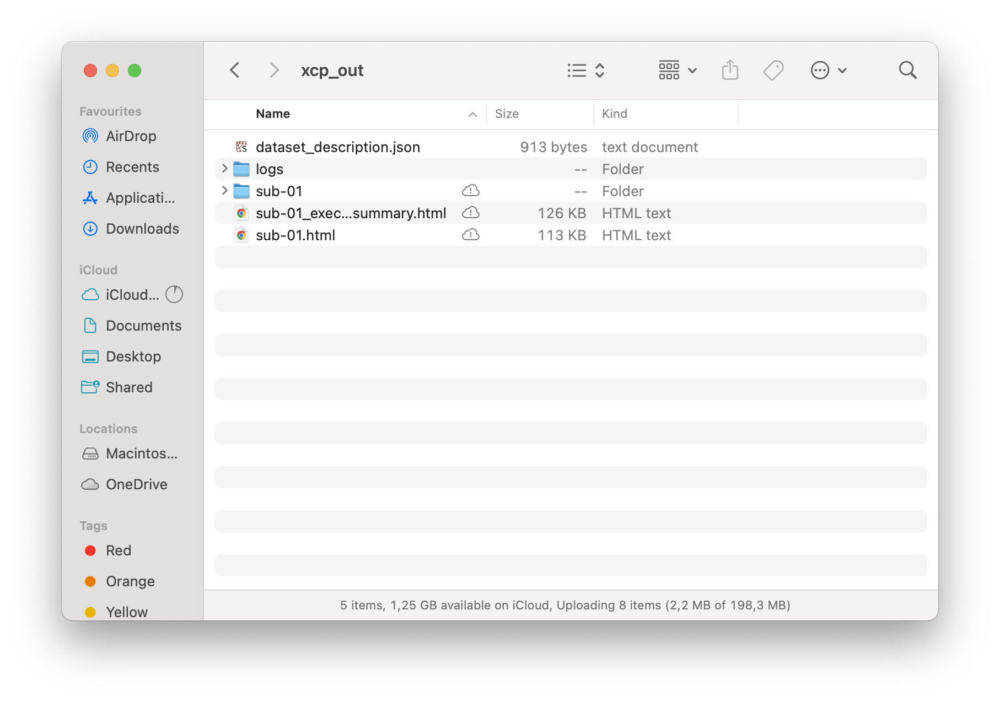


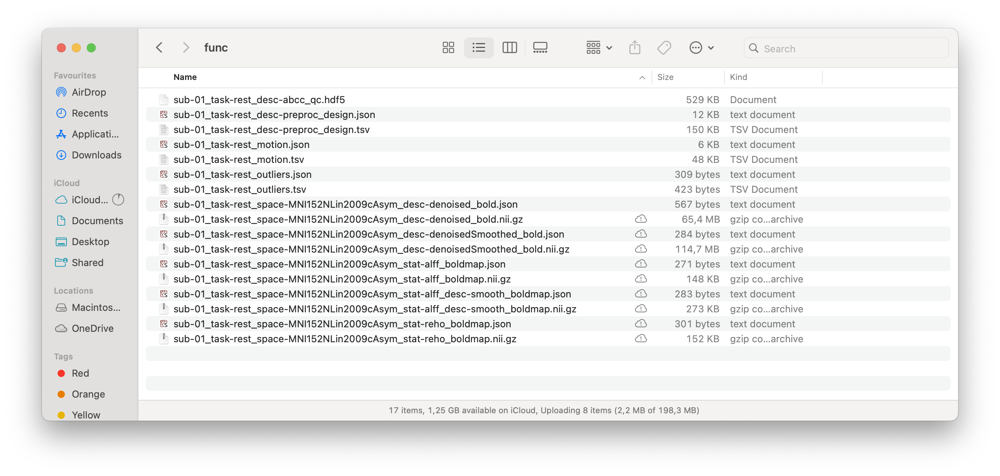


---



### `sub-01/func/` Folder — Functional Outputs

This folder contains denoised BOLD images, design files, quality metrics, and functional derivatives like ALFF and ReHo.

#### Key files:

- `sub-01_task-rest_desc-abcd_qc.hdf5`  
  → Quality control metrics for ABCD-style denoising.

- `sub-01_task-rest_desc-preproc_design.tsv/json`  
  → Design matrix for nuisance regression used during preprocessing.

- `sub-01_task-rest_motion.json/tsv`  
  → Motion parameters (translations, rotations) per timepoint for motion correction.

- `sub-01_task-rest_outliers.json/tsv`  
  → Identifies outlier timepoints (e.g., due to motion spikes).

---

### Denoised and Smoothed BOLD Images

- `sub-01_task-rest_space-MNI152NLin2009cAsym_desc-denoised_bold.nii.gz`  
  → Fully preprocessed and denoised 4D BOLD image in standard MNI space.

- `sub-01_task-rest_space-MNI152NLin2009cAsym_desc-denoisedSmoothed_bold.nii.gz`  
  → Denoised and **smoothed** version of the above BOLD image.

---

### Functional Derivatives

- `*_stat-alff_boldmap.nii.gz`  
  → ALFF (Amplitude of Low-Frequency Fluctuations) map.

- `*_stat-reho_boldmap.nii.gz`  
  → ReHo (Regional Homogeneity) map.

- `*_stat-alff_desc-smooth_boldmap.nii.gz`  
  → Smoothed version of ALFF map.

- `*_stat-reho_desc-smooth_boldmap.nii.gz`  
  → Smoothed version of ReHo map.

Each of these `.nii.gz` files also has a corresponding `.json` file explaining metadata (e.g., calculation parameters, spatial resolution).

---

### Reports

- `sub-01.html`  
  → Full visual report including plots of motion, nuisance regressors, QC metrics, and more.

- `sub-01_executive_summary.html`  
  → Compact report with summaries of motion, image quality, and other key indicators for quick review.



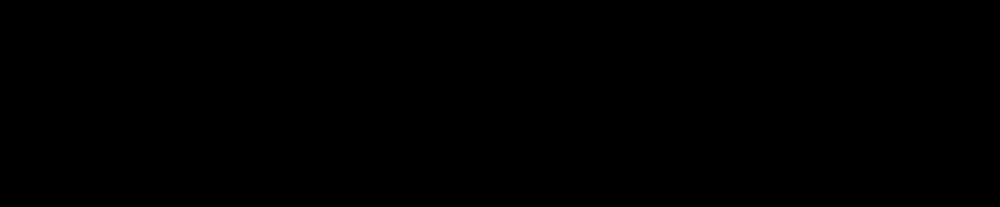
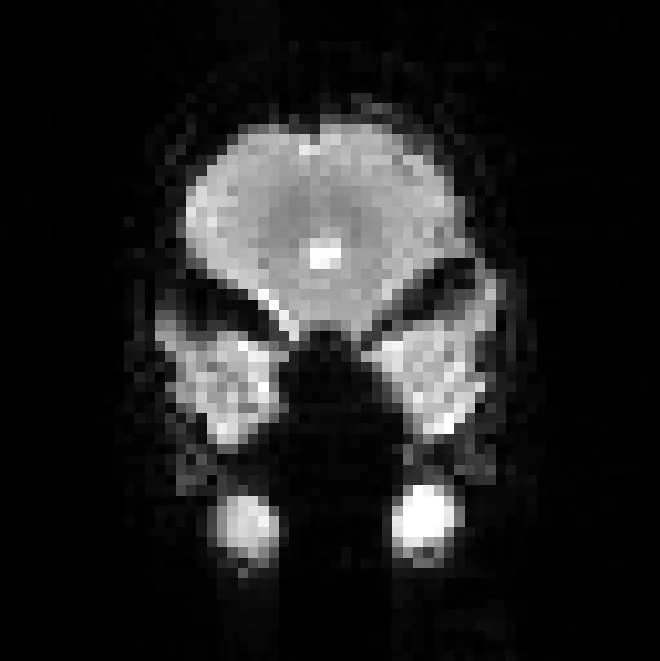
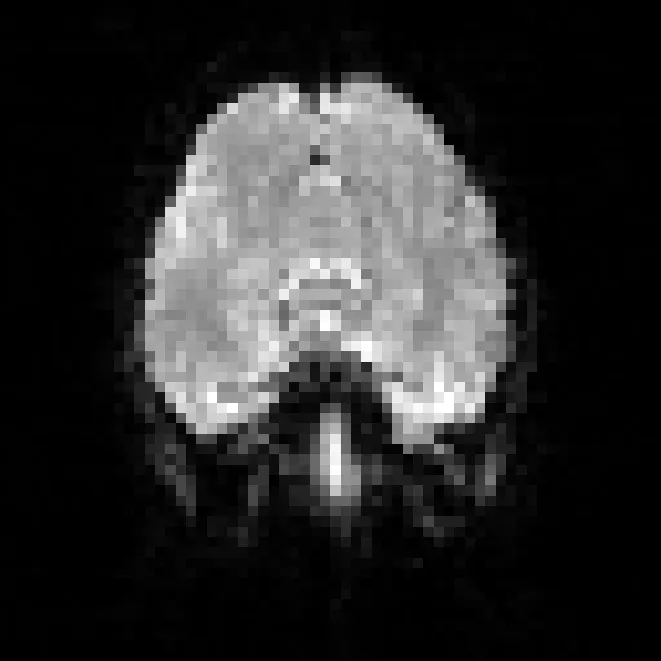
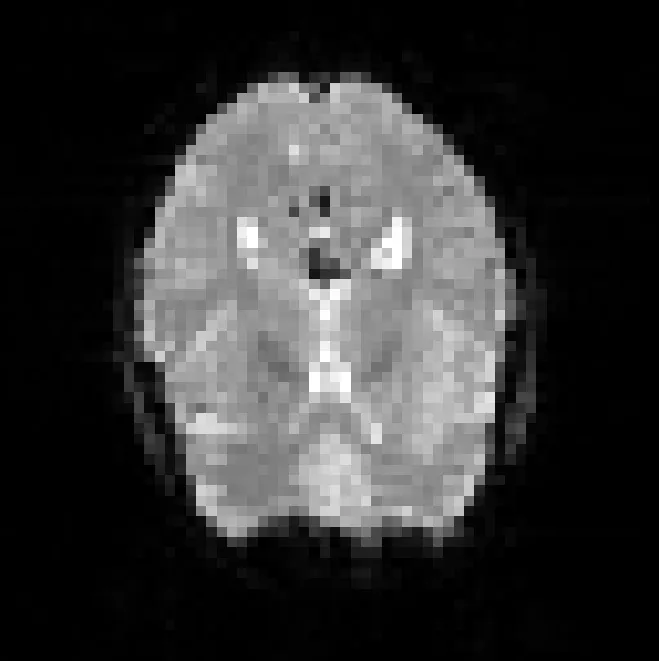
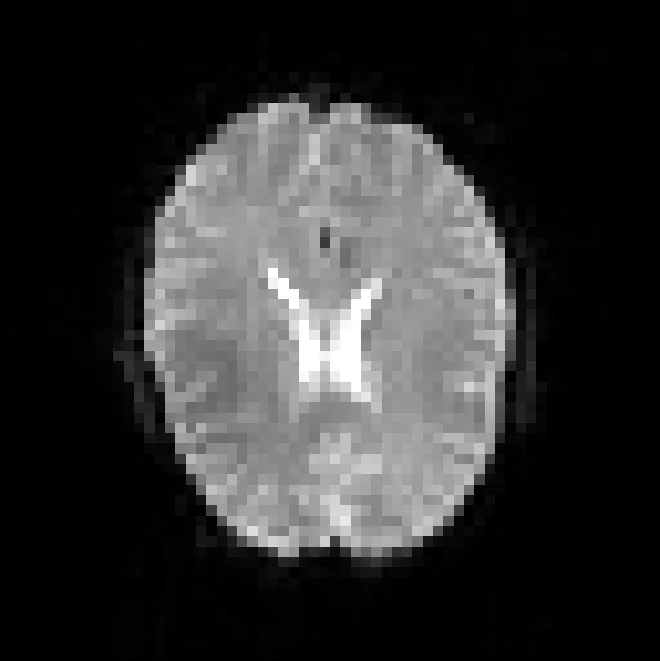
...
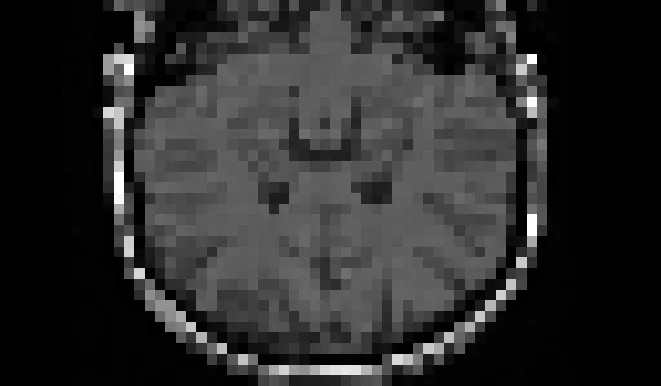
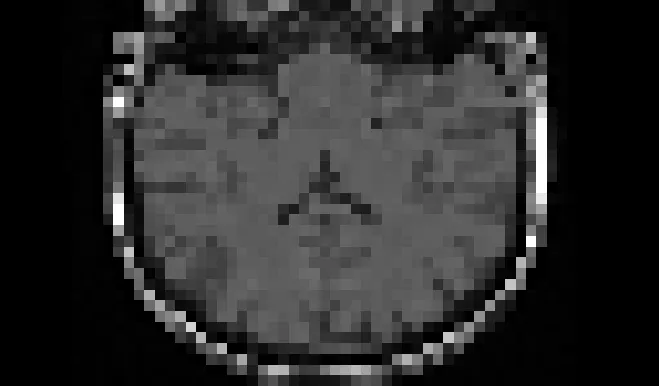
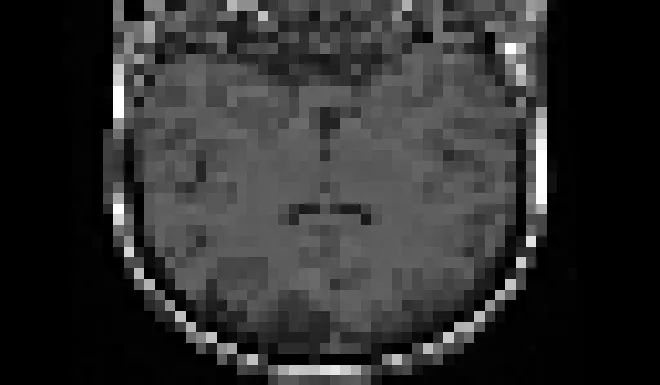
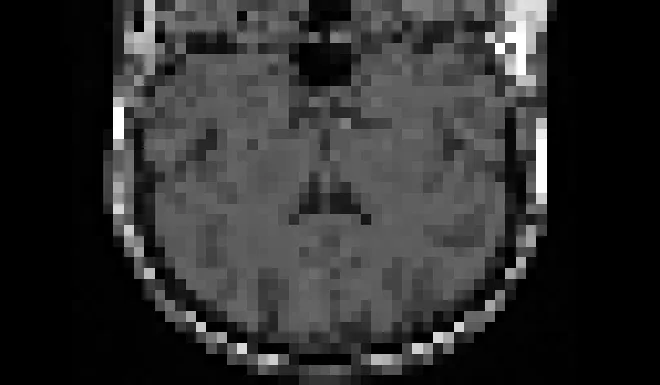
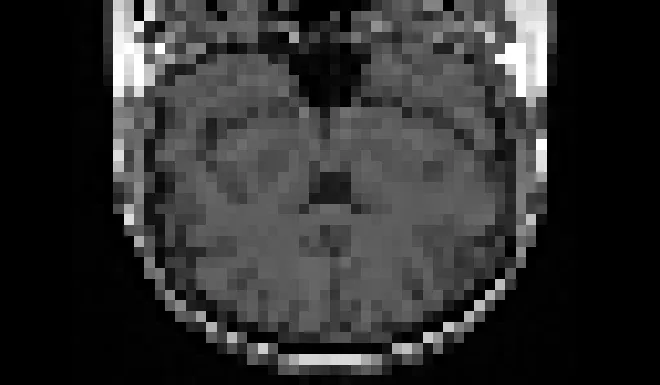

In [383]:
from IPython.display import HTML

with open('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/figures/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-bbregister_bold.svg', "r") as f:
    svg_content = f.read()

display(HTML(svg_content))

**Alignment of functional and anatomical MRI data (surface-driven)**

This figure shows the **coregistration of the functional BOLD image to the anatomical T1-weighted image** using FreeSurfer’s `bbregister`, which performs surface-based alignment (Hold your mouse on the figure to see alternation).

- The grayscale background image is the **T1-weighted anatomical scan**, and the red overlay shows the **aligned functional (BOLD) image**.
- Each slice (axial, sagittal, coronal) shows how well the functional image contours match the anatomy, across multiple planes and coordinates.
- This alignment step is critical, as it ensures that the BOLD signals used in downstream analyses (e.g., denoising, connectivity, or parcellation) are correctly localized to anatomical brain regions.


> **Check for misalignment artifacts** such as displacements or mismatched boundaries between red contours and brain structures.

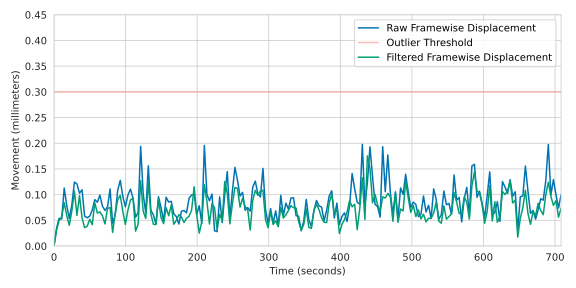

In [385]:
from IPython.display import SVG, display

display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/figures/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-censoring_motion.svg'))

### Framewise Displacement and Censored Volumes  

This figure visualizes head motion throughout the resting-state fMRI scan by plotting **framewise displacement (FD)** — a summary metric of how much the head position changes from one volume to the next.

#### Plot Components:
- **Blue Line:** Raw FD values (in mm) computed from motion parameters.
- **Red Horizontal Line (Threshold = 0.3 mm) (Remember when I visualized I took threshold as 0.5):** Volumes above this threshold are flagged as motion outliers.
- **Green Line:** Filtered FD, representing FD after respiratory artifact correction.

#### Why it matters:
- High FD values indicate **excessive motion**, which can introduce noise and artifacts into the BOLD signal.
- Volumes with FD > 0.3 mm are **censored** — removed from subsequent analysis to improve data quality.
- This plot gives a **QC snapshot** of how much motion occurred and whether it was successfully managed through filtering and censoring.

> Ideal scans will show most FD values **below 0.1 mm**, and minimal timepoints crossing the red line.

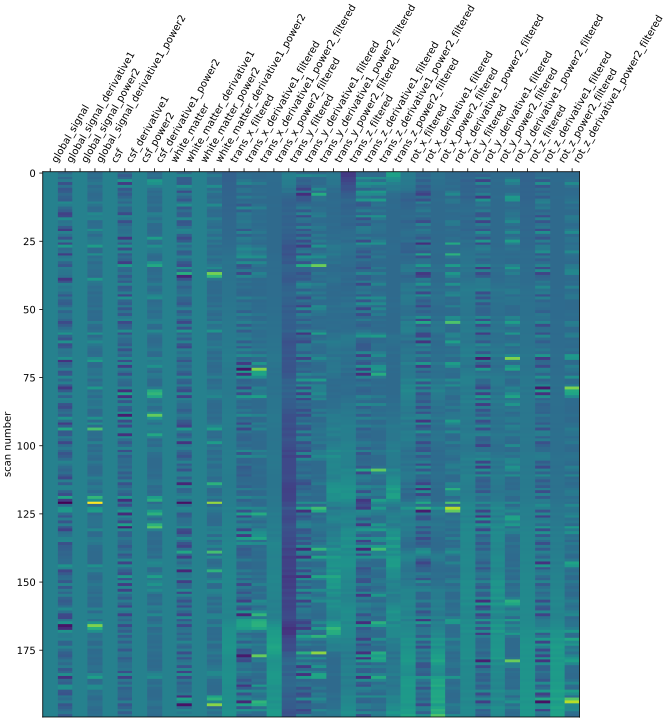

In [387]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/figures/sub-01_task-rest_design.svg'))

### Design Matrix for Confound Regression  

This heatmap represents the **design matrix** used during denoising. Each column corresponds to a **confound regressor**, and each row represents a **volume (scan number)** in the BOLD time series.

#### What is a design matrix?
- It's a structured matrix of **nuisance regressors** that are statistically regressed out of the BOLD signal.
- These confounds account for **non-neural noise sources**

#### Confounds included:
- `global_signal`: Mean intensity across the brain
- `white_matter`, `csf`: Average signal from white matter and cerebrospinal fluid masks
- `trans_x`, `trans_y`, `trans_z`, `rot_x`, `rot_y`, `rot_z`: Motion parameters (translation & rotation).
- `dvars`, `framewise_displacement`, `std_dvars`: Motion summary metrics.
- `*_filtered`, `*_derivative1`, `*_power2`: Variants of above signals including temporal derivatives and squared terms.

#### Why it matters:
- These regressors are **fit to the BOLD data** and removed through regression, producing a **cleaner signal** for downstream analyses.
- This matrix is essential for **minimizing the impact of motion and physiological artifacts**.

> Visual inspection helps confirm that confound signals are not dominated by outliers or gaps.

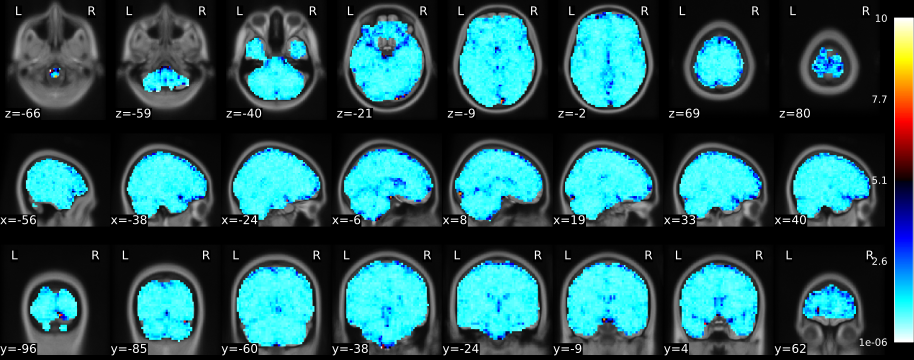

In [389]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/figures/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-alffVolumetricPlot_bold.svg'))

### ALFF — Amplitude of Low-Frequency Fluctuations  

This figure visualizes **ALFF (Amplitude of Low-Frequency Fluctuations)** values across the brain, overlaid on the anatomical T1-weighted image in standard MNI space.

#### What is ALFF?
- ALFF quantifies the **strength of spontaneous BOLD signal fluctuations** in the low-frequency range (typically 0.01–0.1 Hz).
- It reflects **intrinsic neuronal activity** at rest and is often used as a marker for baseline brain function.

#### What wee see in the figure:
- A series of **axial, sagittal, and coronal slices** display ALFF values mapped across the brain.
- The **color scale** represents the relative magnitude of fluctuations:
  - **Warmer colors (yellow/red):** higher amplitude (stronger fluctuations)
  - **Cooler colors (blue):** lower amplitude
- These values are normalized and can be used for **group comparisons**, **clinical population analysis**, or **biomarker discovery**.

> ALFF is particularly useful in studies of disorders with disrupted spontaneous activity, such as depression, ADHD, or schizophrenia.

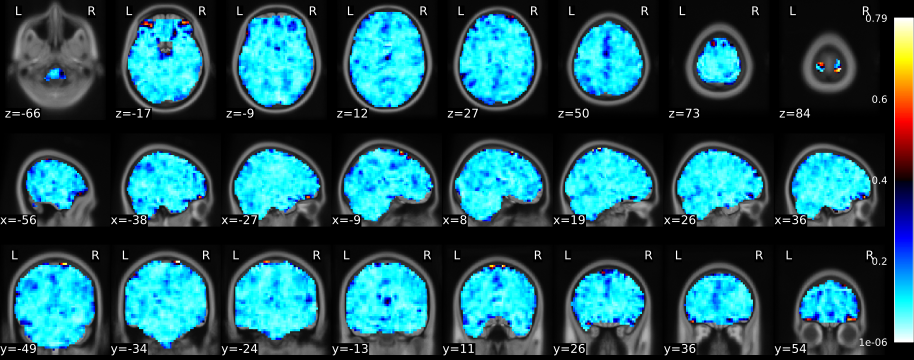

In [391]:
display(SVG(filename='/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/figures/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-rehoVolumetricPlot_bold.svg'))

### ReHo — Regional Homogeneity  

This figure illustrates **Regional Homogeneity (ReHo)** values overlaid on a T1-weighted anatomical image, providing insight into the local synchronization of brain activity during rest.

#### What is ReHo?
- ReHo measures the **similarity or synchrony of the time series** of a given voxel with its neighboring voxels.
- The idea is that **functionally related regions exhibit similar BOLD fluctuations**, especially at rest.


#### What we wee in the figure:
- Axial, sagittal, and coronal slices showing ReHo maps.
- **Brighter/yellow areas:** high regional synchrony (potentially part of functional hubs or networks).
- **Darker/blue areas:** lower synchrony or less local coordination in signal fluctuations.
- The ReHo map is co-registered to the anatomical T1w image in **MNI152NLin2009cAsym** space.

> ReHo is frequently used to assess local functional coherence, especially in studies of neurological or psychiatric disorders like schizophrenia, depression, or epilepsy.

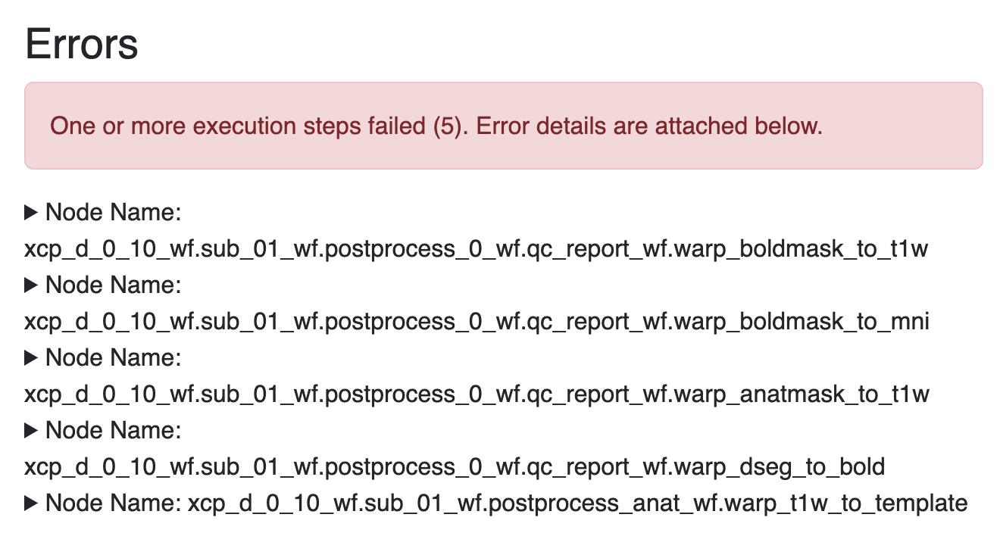

### Errors in XCP-D Processing

Despite successfully generating most outputs, XCP-D encountered **errors in five specific workflow nodes**, particularly during spatial transformations for quality control reporting. These steps are not essential for most downstream analyses but can impact the generation of certain visual reports and outputs.

#### Failed Nodes:
- `warp_boldmask_to_t1w`: Failed to warp the BOLD mask into T1-weighted anatomical space.
- `warp_boldmask_to_mni`: Failed to warp the BOLD mask into MNI standard space.
- `warp_anatmask_to_t1w`: Failed to apply anatomical mask transformation to T1w space.
- `warp_dseg_to_bold`: Failed to warp the discrete anatomical segmentation to the BOLD space.
- `warp_t1w_to_template`: Failed to warp the T1w anatomical image to the MNI template.


- These steps are part of **quality control visualizations** and not central to the functional connectivity analyses (e.g., ALFF, ReHo).
- Most likely caused by missing transformation matrices or misalignment in input data.
- You can still use most of the derived maps (like `*_desc-denoised_bold.nii.gz`, ALFF, ReHo) without issue.

#### Well... Despite the errors XCP-D is still our friend. However, we don't really need it to visualize what it has failed. Even, this can be counted a chance to practice more my visualization skills in Python

Let's visualize them by ourselves:

### Visualizing BOLD mask in T1w anatomical space

The XCP-D pipeline failed at the `warp_boldmask_to_t1w` node, which attempts to transform the BOLD brain mask into the subject's native T1w anatomical space.

We simulate this manually by resampling the BOLD mask from fMRIPrep to the anatomical image using `nilearn.image.resample_to_img`, and overlaying the result for visual inspection.

/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/1615108730.py:8: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  resampled_mask = resample_to_img(bold_mask, anat_img, interpolation="nearest")
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(


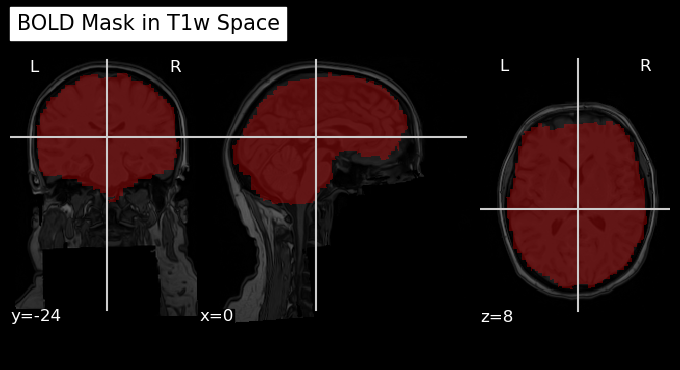

In [397]:
from nilearn.image import load_img, resample_to_img
from nilearn import plotting

bold_mask = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_desc-brain_mask.nii.gz')
anat_img = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/anat/sub-01_desc-preproc_T1w.nii.gz')

# Resample the mask to anatomical space
resampled_mask = resample_to_img(bold_mask, anat_img, interpolation="nearest")

# Plot the resampled mask
plotting.plot_roi(
    resampled_mask,             
    bg_img=anat_img,
    title='BOLD Mask in T1w Space',
    cmap='autumn',
    alpha=0.3                
)
plotting.show()


### Visualizing BOLD Mask in MNI152 Space

The XCP-D pipeline failed at the `warp_boldmask_to_mni` node, which is responsible for aligning the subject-specific BOLD brain mask to a standard MNI152 template space.

Instead of applying transformation matrices, I manually loaded the BOLD mask and the preprocessed T1w anatomical image **already in MNI space** from the fMRIPrep derivatives. Since both files are in the same space (`space-MNI152NLin2009cAsym`), I used `nilearn.image.resample_to_img` to ensure voxel-wise alignment.

Finally, I overlaid the resampled BOLD mask on the MNI-space anatomical image using `nilearn.plotting.plot_roi` to visually inspect the alignment. Some minor misalignment or voxel overextension beyond the brain tissue is expected due to resolution differences between functional and anatomical images

/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/168155429.py:10: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  resampled_mask = resample_to_img(bold_mask_mni, t1w_mni, interpolation="nearest")
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(


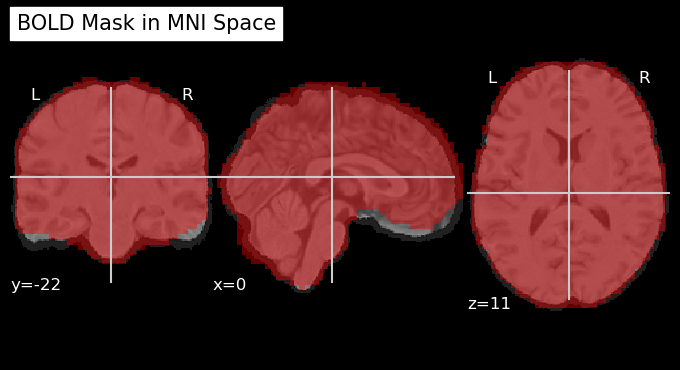

In [399]:
from nilearn.image import load_img, resample_to_img
from nilearn.plotting import plot_roi

#Files I will use

bold_mask_mni = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz')
t1w_mni = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/anat/sub-01_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz')

# Resampling
resampled_mask = resample_to_img(bold_mask_mni, t1w_mni, interpolation="nearest")


plot_roi(resampled_mask, bg_img=t1w_mni, title="BOLD Mask in MNI Space", cmap="autumn", alpha=0.4)

### Visualizing Anatomical Brain Mask in T1w Space

The XCP-D pipeline failed at the `warp_anatmask_to_t1w` node, which is responsible for ensuring that the anatomical brain mask is properly aligned to the subject's native T1-weighted (T1w) anatomical image.


To simulate this step manually, I will:
- Load the anatomical brain mask
- Load the corresponding anatomical image
- Resample the brain mask to match the anatomical image dimensions and orientation if necessary
- Overlay the mask on the anatomical background for visual quality inspection

This helps confirm that the anatomical mask fits well within the structural image and can be used in further downstream analysis.


/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/2823009466.py:11: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  resampled_anat_mask=resample_to_img(anatomical_mask, t1w_image, interpolation="nearest")
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(


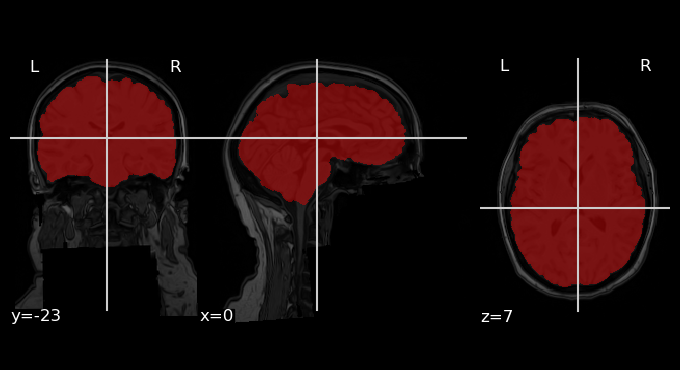

In [401]:
from nilearn.image import load_img, resample_to_img
from nilearn.plotting import plot_roi

#I am loading anatomical mask and image

anatomical_mask=load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/anat/sub-01_desc-brain_mask.nii.gz')
t1w_image=load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/anat/sub-01_desc-preproc_T1w.nii.gz')

#resampling

resampled_anat_mask=resample_to_img(anatomical_mask, t1w_image, interpolation="nearest")

#plotting
plot_roi(resampled_anat_mask, bg_img=t1w_image, cmap="autumn", alpha=0.4)

### Visualizing Segmentation Map (dseg) in BOLD Space

The XCP-D pipeline failed at the `warp_dseg_to_bold` node, which is responsible for transforming the anatomical segmentation map (`dseg.nii.gz`) into BOLD space. This step is essential for generating carpet plots and associating BOLD signal with specific tissue types such as gray matter, white matter, and CSF.

In our case, the anatomical segmentation map is already aligned in MNI152 space, as is the preprocessed BOLD image. Therefore, we can manually perform this step by:

- Loading the `dseg` segmentation map in MNI space
- Loading the preprocessed BOLD image in MNI space
- Resampling the `dseg` image to the BOLD image resolution
- Visualizing the resampled segmentation map over the BOLD reference image

/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/2903528777.py:8: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  bold_mean_img= mean_img(bold_img)
/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/2903528777.py:11: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  resampled_dseg = resample_to_img(dseg_img, bold_mean_img, interpolation='nearest')
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set

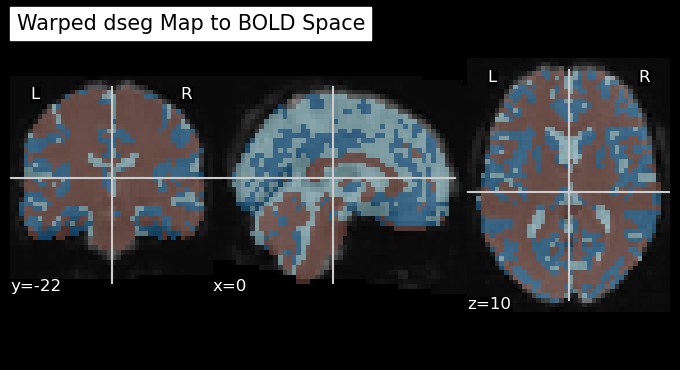

In [403]:
from nilearn.image import load_img, resample_to_img, mean_img
from nilearn.plotting import plot_roi

# loading the segmentation map and the preprocessed BOLD image (both in MNI space)
dseg_img = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/anat/sub-01_space-MNI152NLin2009cAsym_dseg.nii.gz')
bold_img = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/derivatives/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz') #it is 4D, so I cannot visualize it with plot_roi

bold_mean_img= mean_img(bold_img)

# Resample the dseg map to the resolution of the BOLD image
resampled_dseg = resample_to_img(dseg_img, bold_mean_img, interpolation='nearest')

# Visualize the segmentation map on top of the BOLD image
plot_roi(resampled_dseg, bg_img=bold_mean_img,
         title='Warped dseg Map to BOLD Space',
         cmap='tab20', alpha=0.5)


### Color Lookup Table (LUT) Conversion Error — Non-Critical

The final warning in the XCP-D pipeline was raised by the `freesurfer_lut_to_bids_colorlut` node. This step attempts to convert FreeSurfer’s color lookup table (e.g., `FreeSurferColorLUT.txt`) into a BIDS-compliant color LUT format used for consistent labeling and coloring of anatomical regions (e.g., aseg, aparc+aseg) during visualization.

## 4. Functional Connectivity Analysis

Now that we have a clean, denoised BOLD timeseries in MNI space, we can begin computing functional connectivity.

This process involves extracting average time series from predefined brain regions (ROIs) using a parcellation atlas (e.g., Schaefer), and then computing the correlation matrix across all ROI time series.

This step allows us to move from raw voxelwise time series to interpretable region-level functional networks.

**Functional connectivity (FC)** refers to the temporal correlation between spatially remote neurophysiological events, typically measured by analyzing how the BOLD signal fluctuates across different brain regions during rest or tasks. If two regions show highly correlated activity over time, they are said to be functionally connected.

Unlike structural connectivity (which reflects physical connections via white matter tracts) or effective connectivity (which aims to infer causal influences), **functional connectivity captures statistical dependencies**—usually via Pearson correlation—between region-wise time series.

#### Why do we use it?

- To understand **how brain regions communicate** and form large-scale networks (e.g., the default mode network, attention networks).
- To explore **altered connectivity patterns** in clinical populations (e.g., depression, ADHD, Alzheimer’s).
- To derive **connectome-based biomarkers** for individual traits or mental states.
- To investigate **dynamic changes** in network interactions over time or tasks.

#### **How functional connectivity measured?**

- **BOLD Time Series Extraction:**  
  For each brain region, we extract the mean BOLD signal at every time point, resulting in one time series per region. For example, region A might have a time series like `[a₁, a₂, a₃, ..., aₙ]` across all acquired fMRI volumes.

- **Temporal Correlation:**  
  FC is typically quantified by **computing the Pearson correlation coefficient** between the time series of every pair of regions. If region A and region B show similar fluctiations in their BOLD signal over time, their correlation will be high (close to 1). If they fluctuate independently, the correlation will be near 0. If they are anti-correlated, it will be negative.
- **Functional Connectivity Matrix:**  
  By repeating this for all region pairs, we get a symmetric matrix—often called the **functional connectome**—where each entry shows the strength of connectivity between two regions.

#### To Wrap Up

- If at any given time point *t*, region A’s BOLD signal is high and region B’s signal is also high (and this pattern holds across time), it suggests **synchronous neural activity** or shared information processing.
- Conversely, if the BOLD signals between two regions are unrelated, it suggests less functional communication during the scan.

/opt/anaconda3/lib/python3.12/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: UserWarning: Casting data from int32 to float32
  return resample_img(



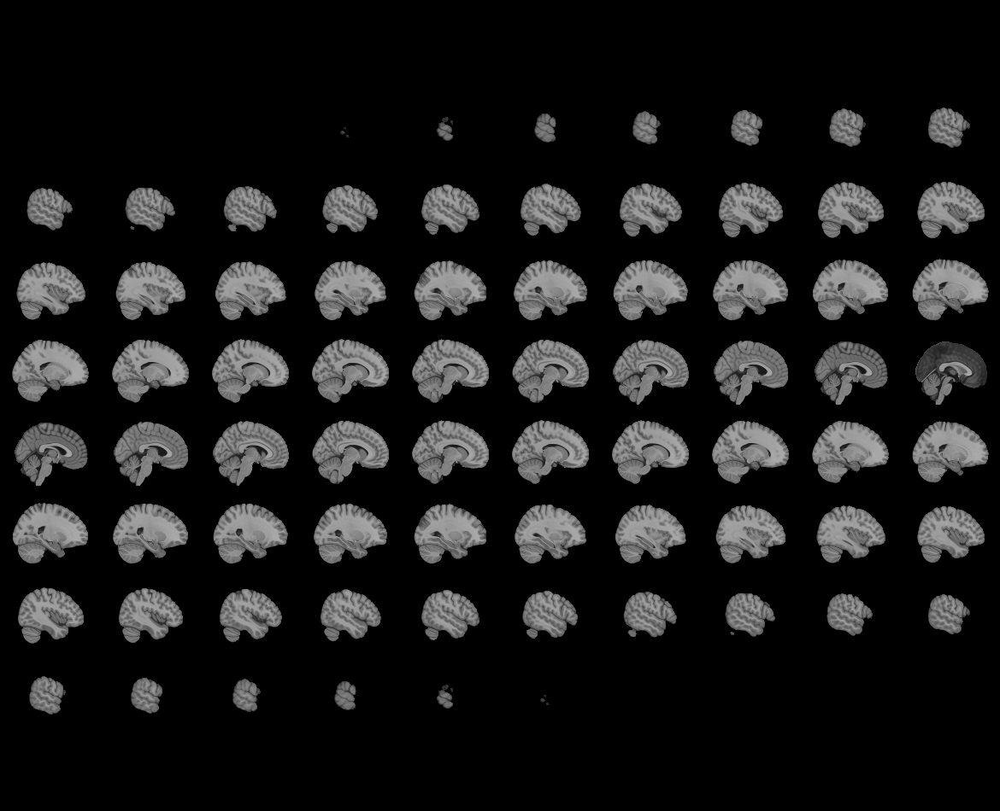
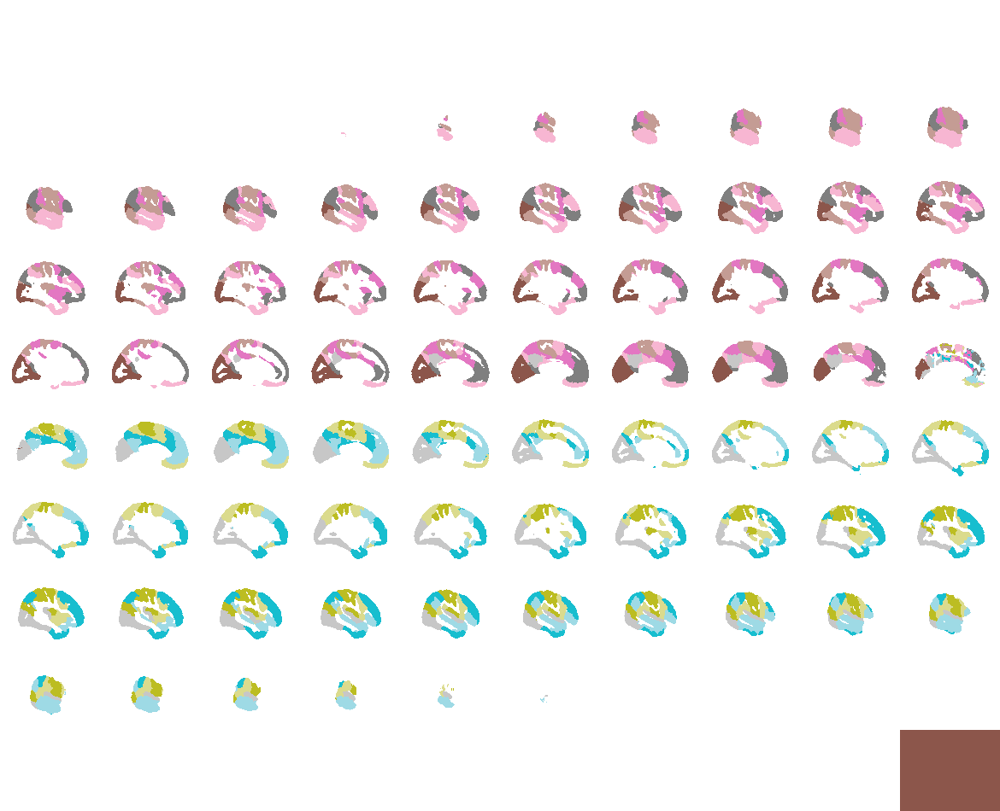

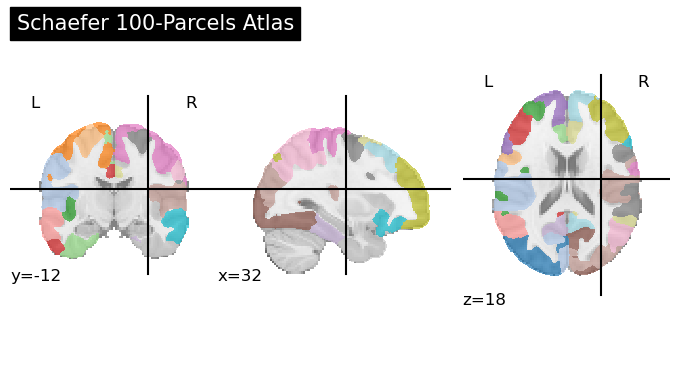

In [407]:
#As a first step we need to extract time series data from regions of interest (ROIs)
#To do so we need to choose an atlas which we can use it's functional parcellations
#I will use schaefer 100 parcels atlas

from nilearn.image import load_img
from nilearn.plotting import plot_roi

#Defining path of atlas I have downloaded previously
atlas_img = load_img('/Users/ogulcanulu/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-100Parcels7Networks_dseg.nii.gz') #MNI152 2009 because our preprocessed data is also in the same space.

plot_roi(atlas_img, title="Schaefer 100-Parcels Atlas", cmap="tab20") #parcellation

from nilearn import plotting
from IPython.display import display, Markdown
plotting.view_img(atlas_img, cmap='tab20', threshold=1) #interactive atlas

### Extracting ROI-wise Time Series from Preprocessed BOLD Data

Now that we've visualized the Schaefer2018 100-parcel, 7-network atlas in MNI152NLin2009cAsym space, we proceed with extracting the **mean BOLD signal for each ROI**. This step forms the basis of functional connectivity analysis.

Each region (or parcel) in the atlas corresponds to a specific functional network. By averaging the BOLD signal across all voxels in a given parcel at each time point, we obtain a 1D time series that represents the activity of that region over time.

This allows us to construct a **time × ROI** matrix, which will later be used to compute **pairwise correlations between regions**—the foundation of the functional connectivity matrix.

To ensure compatibility:
- The parcellation atlas and the preprocessed BOLD data must be in the **same space** (here I used MNI152NLin2009cAsym).
- The **resampling step** is applied if their resolutions or dimensions differ slightly.


/var/folders/zk/v8829m_n529b1_hzrntkl8t40000gn/T/ipykernel_24774/1484982862.py:11: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  resampled_atlas = resample_to_img(atlas_img, bold_img, interpolation="nearest")
/opt/anaconda3/lib/python3.12/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(


Extracted time series shape: (200, 100)


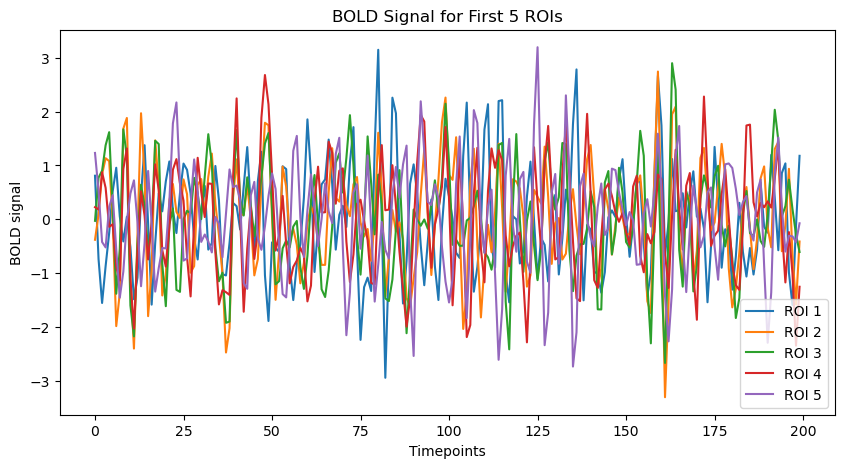

In [409]:
from nilearn.input_data import NiftiLabelsMasker
from nilearn.image import load_img, resample_to_img
import numpy as np
import matplotlib.pyplot as plt

#files I will use
bold_img = load_img('/Users/ogulcanulu/Desktop/Functional and Effective Connectivity/xcp_out/sub-01/func/sub-01_task-rest_space-MNI152NLin2009cAsym_desc-denoised_bold.nii.gz') #this was the data which has preprocessed by fMRIPrep and postprocessed by XCP-D
atlas_img = load_img('/Users/ogulcanulu/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-100Parcels7Networks_dseg.nii.gz')

# Resampling
resampled_atlas = resample_to_img(atlas_img, bold_img, interpolation="nearest")

#masking takes atlas and bold image and extracts average BOLD time series for each labeled region
masker = NiftiLabelsMasker(labels_img=resampled_atlas, standardize=True, detrend=True, t_r=3.56) #TR for our case was 3.56 second

#extracting time series
time_series = masker.fit_transform(bold_img) 

#it looks at the atlas and groups of voxels based on their parcel label. For example schaefer atlas says voxel 1 and voxel 2 are in parcel 17 etc. it bundles them together.
#For each parcel it finds the voxels inside of the parcel and averages their BOLD signals at every time point
#Therefore we have one time series for each parcel

# Check the shape of the result
print(f"Extracted time series shape: {time_series.shape}")

# Plot the time series for the first 5 ROIs
plt.figure(figsize=(10, 5))
plt.plot(time_series[:, :5])
plt.xlabel('Timepoints')
plt.ylabel('BOLD signal')
plt.title('BOLD Signal for First 5 ROIs')
plt.legend([f'ROI {i+1}' for i in range(5)])
plt.show()


### Wrap up what we did here

To perform functional connectivity analysis, we first need to extract the time series of BOLD signals from predefined brain regions, called Regions of Interest (ROIs). For this purpose, we used the **Schaefer 100-parcel atlas**, a functional parcellation of the cortex that assigns each voxel in the brain to one of 100 functional regions.

We used the `NiftiLabelsMasker` from Nilearn, which takes:
- A **4D preprocessed BOLD image** (here, denoised by XCP-D),
- A **3D labeled atlas image**, where each voxel is assigned a region label.

The masker averages the BOLD signal across all voxels that belong to the same parcel at each timepoint.

The result is a clean and compact representation of brain activity over time, ready for correlation-based functional connectivity analysis.

### Compute Functional Connectivity Matrix

After extracting the BOLD time series for each region of interest (ROI), the next step is to quantify the relationship between these regions over time — this is what is called **functional connectivity**.

In this analysis, I'll compute **Pearson correlation coefficients** between the time series of all ROI pairs. This gives us a **functional connectivity matrix**, where:

- Each **row and column corresponds to an ROI** (based on the atlas).
- Each **cell [i, j]** in the matrix reflects how similar (correlated) the BOLD signal is between **ROI i** and **ROI j**.
- High positive values (close to 1) indicate strong synchrony, while negative values (close to -1) indicate inverse relationships.

This matrix reveals patterns of co-activation across the brain and is the foundation for many neuroscience analyses such as brain network mapping, graph theory, and clinical comparisons.

We’ll visualize this matrix using a heatmap to observe functional connections between parcels.


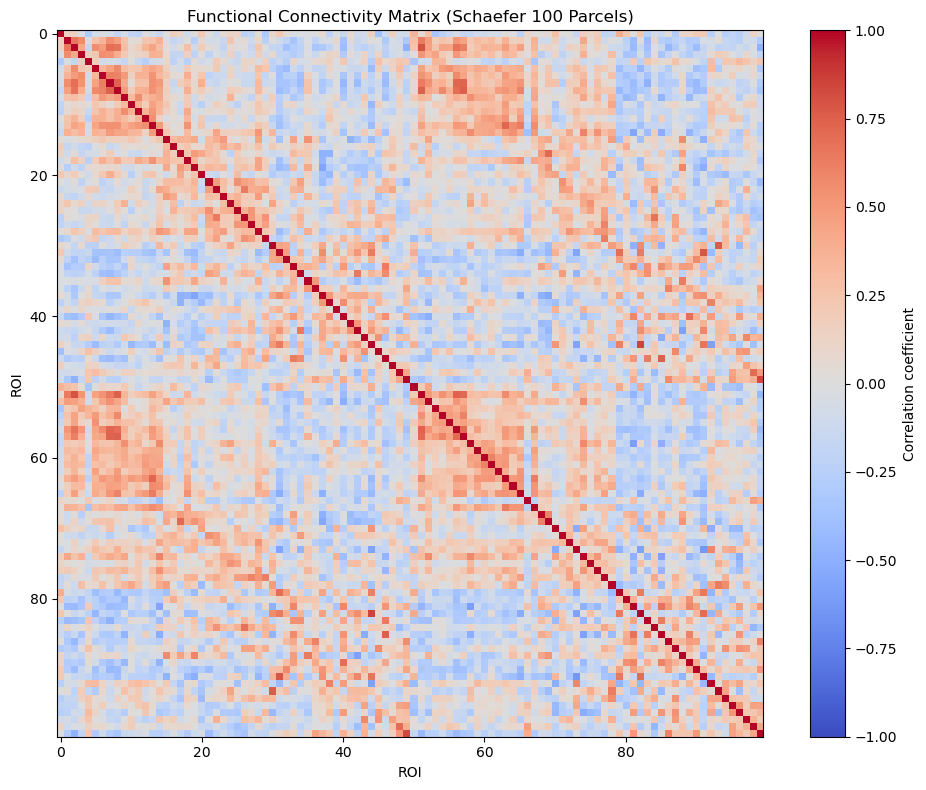

In [412]:
import numpy as np
import matplotlib.pyplot as plt

# Computing the pearson correlation matrix across ROIs
correlation_matrix = np.corrcoef(time_series.T) #transposing the time_series because it has the shape of n_timepotins, n_parcels) but we need n_parcels, n_timepoints shape to compare row vs row

# Plotting connectivity matrix
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, vmin=-1, vmax=1, cmap='coolwarm')
plt.colorbar(label='Correlation coefficient')
plt.title('Functional Connectivity Matrix (Schaefer 100 Parcels)')
plt.xlabel('ROI')
plt.ylabel('ROI')
plt.tight_layout()
plt.show()


Well.. I realized that I did not include ROIs name they appear as numbers.

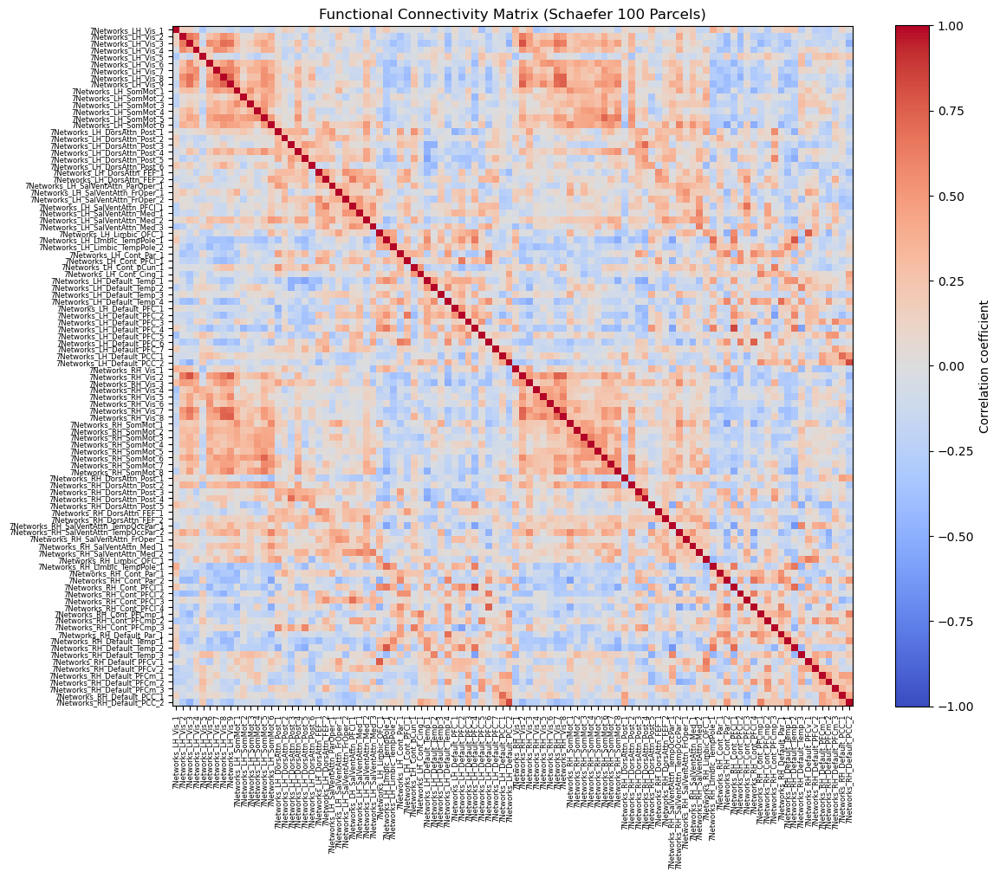

In [414]:
import pandas as pd
label_path = "/Users/ogulcanulu/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_atlas-Schaefer2018_desc-100Parcels7Networks_dseg.tsv"
roi_labels = pd.read_csv(label_path, sep="\t")
roi_names = roi_labels["name"].values

import numpy as np
import matplotlib.pyplot as plt

correlation_matrix = np.corrcoef(time_series.T)

#Matrix with ROI names
plt.figure(figsize=(12, 10))
im = plt.imshow(correlation_matrix, vmin=-1, vmax=1, cmap='coolwarm')
plt.colorbar(im, label='Correlation coefficient')
plt.title('Functional Connectivity Matrix (Schaefer 100 Parcels)')
plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, fontsize=6)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=6)
plt.tight_layout()
plt.show()

### Visualizing Functional Connectivity at the Network Level

Parcel-level functional connectivity matrices (e.g., from the Schaefer 100-parcel atlas) can be difficult to interpret due to the sheer number of regions and labels. Instead, we can improve interpretability by grouping parcels into their corresponding **functional networks**.

The Schaefer 100-parcel, 7-network atlas assigns each ROI to one of the following large-scale networks:

- Visual
- Somatomotor
- Dorsal Attention
- Ventral Attention
- Limbic
- Frontoparietal (Control)
- Default Mode


Following screenshot shows how my TSV file which contains names of the parcels look like now, instead of looking region to region correlations I want to see if a network correlated with another during rest.

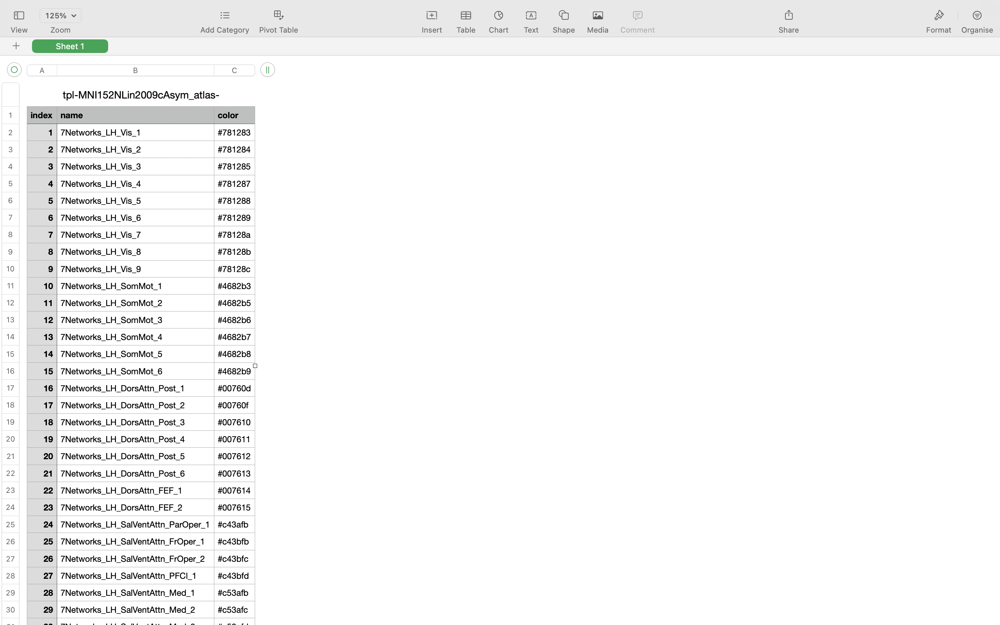

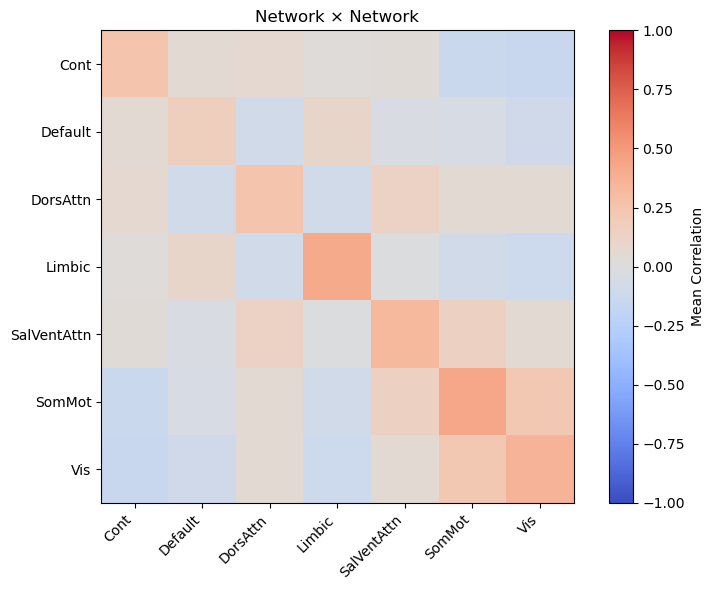

In [416]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#This script was complex to write that's why I am going to explain each part.

#I am loading the atlas path where I find the labels of the parcels.
label_path = "/Users/ogulcanulu/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_atlas-Schaefer2018_desc-100Parcels7Networks_dseg.tsv"
roi_labels = pd.read_csv(label_path, sep="\t")


# Extract network name from 'name' column where we see names of the networks indicated as for example "_LH_Vis_1" this indicates that parcel belongs to Visual network basically.

roi_labels['network'] = roi_labels['name'].apply(lambda x: x.split('_')[2]) #this will add another column named "network" to my TSV file containing only the network name for each parcel

#Well python indexing starts from 0. So splitting 2nd object means that we are extracting 3rd object in the name. Which is "7Networks_LH_Vis_1".split('_')  ['7Networks', 'LH', 'Vis', '1']" in this name corresponding the "Vis" indicating the network.

networks = sorted(roi_labels['network'].unique()) #this lists the unique networks removing the duplicates and sorting alphabetically

network_corr_matrix = pd.DataFrame(index=networks, columns=networks, dtype=float) #empty dataframe 7x7 to be filled with network names which we listed alphabetically in the previous line


#Now we need to have mean correlation between parcels within each networks and add them to the empty matrixc we have created. 
#This part is a bit tricky since it contains nested loop.

#What we do here is computing average connectivity strength between every pair of brain networks

for net1 in networks: #we are starting a iteration in the networks list we have sorted previously will iterate each network one by one
    idx_net1 = roi_labels.index[roi_labels['network'] == net1].tolist() #creates a true false boolean to identify parcels belonging to that network and converts it to a list and keep it in a variable idx_net1
    for net2 in networks: #will do same for another network as current iteration for net1 is running therefore we will have 2 networks at the same time to compare one another
        idx_net2 = roi_labels.index[roi_labels['network'] == net2].tolist() #identifies parcels for the second network for instance net1 is default network while net2 is Visual network. However it will also coincidence by itself too like Default vs Default
        mean_corr = np.mean(correlation_matrix[np.ix_(idx_net1, idx_net2)]) #Will create a matrix where rows are indexed net1 parcels while columns are indexed net2 parcels and calculate the average correlation in the blocks
        network_corr_matrix.loc[net1, net2] = mean_corr #we are storing the results in 7x7 empty matrix we have created previously 

# Plot the network × network connectivity matrix
plt.figure(figsize=(8, 6))
plt.imshow(network_corr_matrix.astype(float), vmin=-1, vmax=1, cmap='coolwarm')
plt.colorbar(label='Mean Correlation')
plt.title('Network × Network')
plt.xticks(ticks=np.arange(len(networks)), labels=networks, rotation=45, ha='right')
plt.yticks(ticks=np.arange(len(networks)), labels=networks)
plt.tight_layout()
plt.show()


## Network × Network Functional Connectivity Matrix

We grouped the 100 parcels of the Schaefer atlas into 7 brain networks and computed their **mean pairwise correlations**.

This 7×7 matrix summarizes the **average functional connectivity** between each pair of networks:

- **Rows/Columns**: Represent the 7 brain networks:  
  - `Vis`: Visual  
  - `SomMot`: Somatomotor  
  - `DorsAttn`: Dorsal Attention  
  - `SalVentAttn`: Salience/Ventral Attention  
  - `Limbic`: Limbic  
  - `Cont`: Control  
  - `Default`: Default Mode Network

- **Cell values**: The average of all BOLD signal correlations between parcels in one network and parcels in another.

- **Color map**:  
  - **Warm colors**: Positive correlations -> Networks tend to co-activate  
  - **Cool colors**: Negative correlations -> Networks tend to anti-correlate

---

- **Strong within-network connectivity** is expected and appears along the diagonal (e.g., Default–Default, Visual–Visual).
- **Anti-correlations** often occur between the **Default Mode Network** and **task-positive networks** like DorsAttn or Visual.
- The **Limbic network** tends to be more internally focused and often shows weaker connectivity to sensory regions.
- Moderate correlations between **Salience** and **Attention networks** are consistent with their shared roles.

This matrix provides a **compact summary of the brain’s intrinsic organization**, and can be used for comparing subject groups, studying training effects, or analyzing disease-related connectivity disruptions.


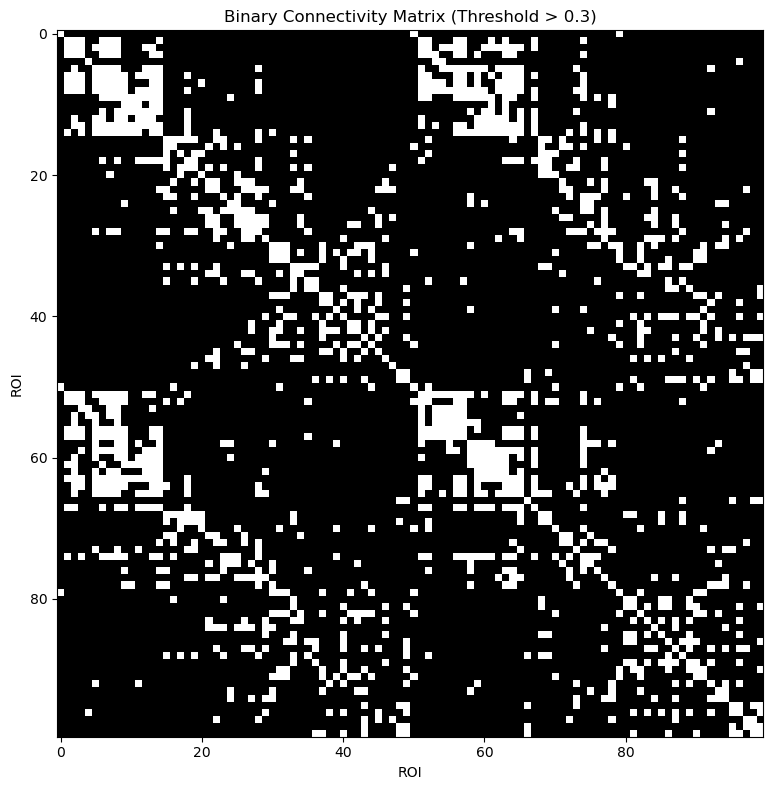

In [418]:
#I want to see only strong correlations above 0.3
threshold = 0.3
thresholded_matrix = (correlation_matrix > threshold).astype(int)

plt.figure(figsize=(10, 8))
plt.imshow(thresholded_matrix, cmap='gray')
plt.title(f'Binary Connectivity Matrix (Threshold > {threshold})')
plt.xlabel('ROI')
plt.ylabel('ROI')
plt.tight_layout()
plt.show()


## Binary Connectivity Matrix (Threshold > 0.3)

This matrix is a binarized version of the functional connectivity matrix. Each element in the matrix represents whether a pair of ROIs have a correlation **greater than 0.3**:

- **White (1)**: The two ROIs are considered **strongly functionally connected**
- **Black (0)**: The correlation is below the threshold

It is useful for:

- Identifying **densely connected parcels**
- Performing **graph-theoretical analysis**
- Studying **network sparsity** and **global connectivity patterns**

> This is especially helpful in graph-based neuroscience, where the brain is modeled as a network of nodes (ROIs) and edges


In [420]:
#Let's see which regions are highly correlated with each other.

# definingt he threshold again for clarity
threshold = 0.3

# empty list to store strongly connected ROI pairs
strong_connections = []


for i in range(correlation_matrix.shape[0]): #rows
    for j in range(i + 1, correlation_matrix.shape[1]): #i+1 because I want to only see upper triangle (above the diagonal) because it's symmetrical and I would get same results. Also I want to avoid i==j ended up in parcel1xparcel1 pair which will naturally be 1.
        if correlation_matrix[i, j] > threshold: #conditions to proceed loop that if region i and region j correlation above the threshold.
            roi1 = roi_labels.loc[i, 'name'] #gets the name of roi i
            roi2 = roi_labels.loc[j, 'name'] #gets the name of roi j
            corr_value = correlation_matrix[i, j] #stores the actual correlation value between i and j
            strong_connections.append((roi1, roi2, corr_value)) #appending those region i and j and their values to the empty list we have created previously

#creating a dataframe taking input strong connections place them into columns I named ROI1 ROI2 and correlations
strong_df = pd.DataFrame(strong_connections, columns=['ROI 1', 'ROI 2', 'Correlation'])

#To see the highler correlations sorting the dataframe to descending order
strong_df = strong_df.sort_values(by='Correlation', ascending=False).reset_index(drop=True)

strong_df.head(20) #this is to see top 20 strong connections


,ROI 1,ROI 2,Correlation
0,7Networks_LH_Default_PFC_4,7Networks_RH_Cont_PFCl_1,0.848907
1,7Networks_LH_Default_PCC_2,7Networks_RH_Default_PCC_2,0.828784
2,7Networks_LH_Vis_3,7Networks_RH_Vis_2,0.801809
3,7Networks_LH_Limbic_TempPole_1,7Networks_RH_Default_Temp_2,0.784220
4,7Networks_LH_Limbic_OFC_1,7Networks_RH_Default_PFCv_1,0.763226
5,7Networks_LH_Vis_9,7Networks_RH_Vis_8,0.748155
6,7Networks_LH_Default_PFC_6,7Networks_RH_Cont_PFCl_4,0.747880
7,7Networks_LH_Vis_9,7Networks_RH_Vis_2,0.744156
8,7Networks_RH_Vis_2,7Networks_RH_Vis_7,0.741897
9,7Networks_LH_Vis_8,7Networks_LH_Vis_9,0.734898


The table above lists the top region pairs whose BOLD time series are most strongly correlated, based on a threshold applied to the functional connectivity matrix. These represent regions whose activity fluctuates together over time — suggesting **functional connectivity**.


- **Default Mode Network (DMN) Dominance**  
  Several top correlations involve DMN regions
  - `LH_Default_PFC_4` ↔ `RH_Cont_PFC_1` — *0.85*
  - `LH_Default_PCC_2` ↔ `RH_Default_PCC_2` — *0.83*  


These likely reflect mind wandering as the data we used was resting state fMRI data. DMN-FPN integration is also seen, which is plausible during rest as these networks anticorrelate during tasks but may cooperate during self-referential processing. The strong PCC-PCC interhemispheric correlation (LH_Default_PCC_2 <-> RH_Default_PCC_2) is a hallmark of DMN coherence.


- **Strong Interhemispheric Connectivity**  
  Many pairs show **left–right symmetry**
  - `LH_Vis_3` ↔ `RH_Vis_2`
  - `LH_Vis_9` ↔ `RH_Vis_8`
  - `LH_SomMot_5` ↔ `RH_SomMot_6`

These are homotopic connections, typically the strongest in resting-state data due to shared function and anatomical interhemispheric white matter tracts (e.g., corpus collosum). The slightly imperfect symmetry (e.g., Vis_3 <-> Vis_2) may reflect parcel granularity or individual variability.

- **Cross-Network Functional Links**  
  Some ROI pairs span different networks:
  - `LH_Default_PFC_4` ↔ `RH_Cont_PFC_1`
  - `LH_Limbic_TempPole_1` ↔ `RH_Default_Temp_2`  
  This suggests integration between **internally-directed cognition (DMN)** and **cognitive control or limbic modulation**. However coupling of PFC in control network and Default network should be taken into consideration to check if it's artifact related because it's common in frontal regions due to sinuses and cavities but previously we have checked our Framewise displacement and all were below 0.3 threshold.


- **Visual Network Consistency**  
  Repeated appearance of visual ROIs supports reliable detection of **early sensory system connectivity**. These are intra-network (same functional system) and homotopic. Their high correlations confirm data quality, as early sensory networks are robust to noise.


These high-correlation ROI pairs validate that the pipeline successfully captures meaningful neural dynamics — particularly:
- Inter-network and intra-network coordination
- Hemispheric symmetry
- Resting-state systems like DMN, Visual, and Somatomotor

This forms a strong foundation for moving toward **group-level analysis** or **effective connectivity modeling**.


## 5. Reflections & Learnings
This notebook I had wrote was more like personal journey to understand how to analyze MRI and fMRI data to obtain functional connectivity matrices — from raw BIDS data to region-wise functional connectivity matrices. What began as an attempt to better understand the tools used in fMRI analysis evolved into a full exploration of neuroimaging preprocessing, visualization, and basic functional analysis.

### What I Learned
- **fMRIPrep & BIDS**: Importance of standardized data formats. Tools like fMRIPrep and XCP-D make neuroimaging workflows reproducible and scalable — provided the data are BIDS-compliant and organized properly.
- **Error Diagnosis**
- **Atlas-Based Analysis**: Using the Schaefer 100-parcel atlas helped me move beyond raw voxel data to brain networks. Extracting region-wise time series and computing functional connectivity.
- **Tools**: I have tried to improve my proficiency in different python libraries and Docker-based neuroimaging.

### What Confused Me
- **Docker and switching between terminal and python codes**
- **Missing Outputs from XCP-D as well as finding the right documents**
- **Natural complexity of the data that I had dealt with** sometimes I needed to take a break and watch ceiling in silence.

### What I'd Improve Next Time
- Organize files better (It was really painful to trying to find right file for instance to use in overlaying)
- Explore dynamic functional connectivity (DFC) or graph theory metrics.
- Expand the pipeline to include effective connectivity analysis.
- More practice on script writing since some scripts were really complex to comprehend and grasp intuitively.


This notebook as I keep stressing it lays the *foundational layer* for my personal development. I’m well-positioned to move forward with more advanced techniques like:

- DCM (Dynamic Causal Modeling)
- Spectral DCM for resting-state
- Using this pipeline for multi-subject analyses